# **Lab: Navier-Stokes equations**
**Gustav Grevsten**

# **Abstract**

In this report, the FEniCS Python library was used in order to implement a finite element solution to the Navier-Stokes equations in 2D. Simulations were ran for a variety of Reynolds numbers for fluid flow past a cylinder of radius $0.4$. It was observed that vortices were produced for higher Reynolds numbers, but required a higher resolution mesh to accurately capture them.

# **About the code and report**

Most of the code as well as the introduction were provided courtesy of Prof. Johan Hoffman (jhoffman@kth.se) as a part of the course DD2365, Advanced Computation in Fluid Mechanics, at KTH Royal Institute of Technology, Stockholm, Sweden.

# **Set up environment**

In [ ]:
# Load neccessary modules.
from google.colab import files

import numpy as np
import time

# Install FEniCS (this may take a long time)
try:
    import dolfin
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenics-install.sh" -O "/tmp/fenics-install.sh" && bash "/tmp/fenics-install.sh"
    import dolfin
    
from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

import logging
logging.getLogger('FFC').setLevel(logging.WARNING)

--2023-04-16 16:08:36--  https://fem-on-colab.github.io/releases/fenics-install.sh
Resolving fem-on-colab.github.io (fem-on-colab.github.io)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to fem-on-colab.github.io (fem-on-colab.github.io)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4156 (4.1K) [application/x-sh]
Saving to: ‘/tmp/fenics-install.sh’

/tmp/fenics-install 100%[===================>]   4.06K  --.-KB/s    in 0s      

2023-04-16 16:08:36 (58.0 MB/s) - ‘/tmp/fenics-install.sh’ saved [4156/4156]

+ INSTALL_PREFIX=/usr/local
++ echo /usr/local
++ awk -F/ '{print NF-1}'
+ INSTALL_PREFIX_DEPTH=2
+ PROJECT_NAME=fem-on-colab
+ SHARE_PREFIX=/usr/local/share/fem-on-colab
+ FENICS_INSTALLED=/usr/local/share/fem-on-colab/fenics.installed
+ [[ ! -f /usr/local/share/fem-on-colab/fenics.installed ]]
+ PYBIND11_INSTALL_SCRIPT_PATH=https://github.com/fem-on-colab/fem-on-colab.github.io/raw/bef019f/releases/pybind11-install.s

# **Introduction**

The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions, and is also exported as pvd-files which can be visualized in Paraview.

We seek a finite element approximation $(u,p)\in V\times Q$ such that 

$(\dot u + (u\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term.

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula: 

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization, 

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder). 

The Reynolds number is defined as $Re=\frac{UD}{\nu}$


# **Method**

For this lab, three separate meshes were generated, each with its own resolution for the mesh grid. The resolutions chosen were $h = \frac{1}{8}, \frac{1}{16},\frac{1}{32}$, with the dimensions $4 \times 2$ and a cylinder centered at the coordinates $(1.0,1.0)$.

**Define domain and mesh**

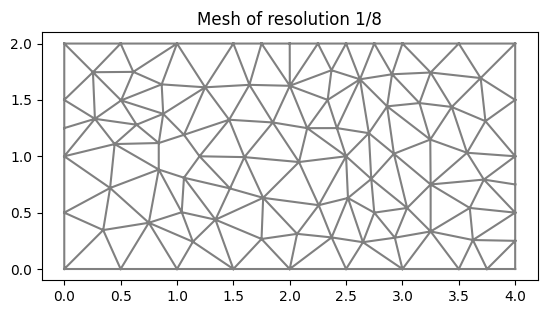

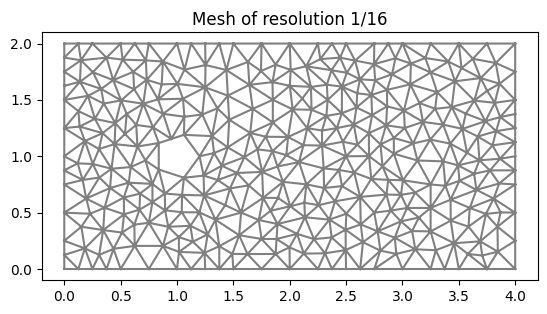

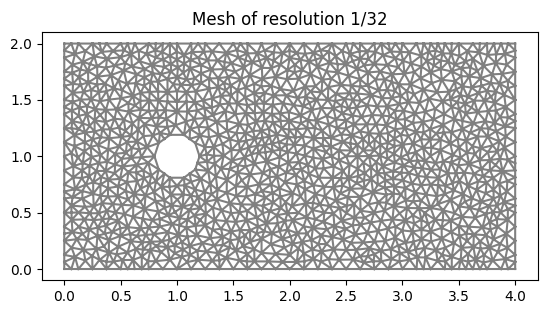

In [ ]:
# Define rectangular domain 
L = 4
H = 2

# Define circle
xc = 1.0
yc = 0.5*H
rc = 0.2

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0) 

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)
      
left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh

#mesh = RectangleMesh(Point(0.0, 0.0), Point(L, H), L*resolution, H*resolution)
mesh_8 = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), 8)
mesh_16 = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), 16)
mesh_32= generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), 32)

mesh_list = [mesh_8, mesh_16, mesh_32]
mesh_res = ["8", "16", "32"]

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
  for cell in cells(mesh):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(xc, yc)) < 1.0:
        cell_marker[cell] = True
  mesh = refine(mesh, cell_marker)

# Define mesh functions (for boundary conditions)
for (res, mesh) in zip(mesh_res, mesh_list):
  globals()['boundaries_%s' % res] = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
  boundaries = globals()['boundaries_%s' % res]
  boundaries.set_all(0)
  left.mark(boundaries, 1)
  right.mark(boundaries, 2)
  lower.mark(boundaries, 3)
  upper.mark(boundaries, 4)

  plt.figure()
  plt.title(f"Mesh of resolution 1/{res}")
  plot(mesh)
  plt.show()

We generate an approximation space using linear polynomials for the interpolation and set up the relevant Dirichlet boundary conditions.

**Define finite element approximation spaces**

In [ ]:
# Generate finite element spaces (for velocity and pressure)
for (res, mesh) in zip(mesh_res, mesh_list):
  globals()['V_%s' % res] = VectorFunctionSpace(mesh, "Lagrange", 1)
  globals()['Q_%s' % res] = FunctionSpace(mesh, "Lagrange", 1)

  # Define trial and test functions 
  globals()['u_%s' % res] = TrialFunction(globals()['V_%s' % res])
  globals()['p_%s' % res] = TrialFunction(globals()['Q_%s' % res])
  globals()['v_%s' % res] = TestFunction(globals()['V_%s' % res])
  globals()['q_%s' % res] = TestFunction(globals()['Q_%s' % res])

**Define boundary conditions**

In [ ]:
# Define boundary conditions 
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) 

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

# Examples of time dependent and stationary inflow conditions
for (res, mesh) in zip(mesh_res, mesh_list):
  V = globals()['V_%s' % res]
  Q = globals()['Q_%s' % res]

  #uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
  #uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)
  uin = 1.0
  bcu_in0 = DirichletBC(V.sub(0), uin, dbc_left)
  bcu_in1 = DirichletBC(V.sub(1), 0.0, dbc_left)
  bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
  bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
  bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
  bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
  bcu_obj0 = DirichletBC(V.sub(0), 0.0, dbc_objects)
  bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

  pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
  pout = 0.0
  #bcp0 = DirichletBC(Q, pin, dbc_left)
  bcp1 = DirichletBC(Q, pout, dbc_right)

  #bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
  globals()['bcu_%s' % res] = [bcu_in0, bcu_in1, bcu_upp1, bcu_low1, bcu_obj0, bcu_obj1]
  globals()['bcp_%s' % res] = [bcp1]

  # Define measure for boundary integration
  globals()['ds_%s' % res] = Measure('ds', domain=mesh, subdomain_data=globals()['boundaries_%s' % res])

# **Results**

For testing the solution for various Reynolds numbers, we note that the Reynolds number is defined as $Re=\frac{UD}{\nu}$. Since $U = 1$ and the diameter of the cylinder is $U = 0.4$, we get that for the various Reynolds numbers $Re=1, 10, 100, 1000$ We get the corresponding viscosity $\nu = 0.4, 4 ⋅ 10^{-2}, 4 ⋅ 10^{-3}, 4 ⋅ 10^{-4}$.

**Define variational problem and compute force on boundary**

In [ ]:
 def solve_NS(res, nu):
  # Define iteration functions
  # (u0,p0) solution from previous time step
  # (u1,p1) linearized solution at present time step

  mesh = globals()['mesh_%s' % res]
  V = globals()['V_%s' % res]
  Q = globals()['Q_%s' % res]

  u = globals()['u_%s' % res]
  p = globals()['p_%s' % res]
  v = globals()['v_%s' % res]
  q = globals()['q_%s' % res]

  bcu = globals()['bcu_%s' % res]
  bcp = globals()['bcp_%s' % res]
  ds = globals()['ds_%s' % res]

  u0 = Function(V)
  u1 = Function(V)
  p0 = Function(Q)
  p1 = Function(Q)

  # Set parameters for nonlinear and lienar solvers 
  num_nnlin_iter = 5 
  prec = "amg" if has_krylov_solver_preconditioner("amg") else "default" 

  # Time step length 
  dt = 0.5*mesh.hmin()

  # Stabilization parameters
  h = CellDiameter(mesh);
  u_mag = sqrt(dot(u1,u1))
  d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
  d2 = h*u_mag

  # Mean velocities for trapozoidal time stepping
  um = 0.5*(u + u0)
  um1 = 0.5*(u1 + u0)

  # Momentum variational equation on residual form
  Fu = inner((u - u0)/dt + grad(um)*um1, v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
      + d1*inner((u - u0)/dt + grad(um)*um1 + grad(p1), grad(v)*um1)*dx + d2*div(um)*div(v)*dx 
  au = lhs(Fu)
  Lu = rhs(Fu)

  # Continuity variational equation on residual form
  Fp = d1*inner((u1 - u0)/dt + grad(um1)*um1 + grad(p), grad(q))*dx + div(um1)*q*dx 
  ap = lhs(Fp)
  Lp = rhs(Fp)

  # Define the direction of the force to be computed
  phi_x_lift = 0.0
  phi_y_lift = 1.0

  phi_x_drag = 1.0
  phi_y_drag = 0.0

  #psi_expression = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
  psi_expression_drag = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x_drag, phi_y=phi_y_drag, element = V.ufl_element())
  psi_drag = interpolate(psi_expression_drag, V)

  #psi_expression = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
  psi_expression_lift = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x_lift, phi_y=phi_y_lift, element = V.ufl_element())
  psi_lift = interpolate(psi_expression_lift, V)

  Force_drag = inner((u1 - u0)/dt + grad(um1)*um1, psi_drag)*dx - p1*div(psi_drag)*dx + nu*inner(grad(um1), grad(psi_drag))*dx

  Force_lift = inner((u1 - u0)/dt + grad(um1)*um1, psi_lift)*dx - p1*div(psi_lift)*dx + nu*inner(grad(um1), grad(psi_lift))*dx

  #plt.figure()
  #plot(psi, title="weight function psi")

  # Force normalization
  D = 2*rc
  normalization = -2.0/D

  return au, Lu, bcu, u1, u0, ap, Lp, bcp, p1, p0, Force_drag, Force_lift, dt, ds, normalization, num_nnlin_iter, prec

**Set plotting variables, open export files and plot solution**

In [ ]:
def time_step(res, mu, movie = False):
  !rm results-NS/*

  if movie:
    file_u = File("results-NS/u.pvd")
    file_p = File("results-NS/p.pvd")

  # Set plot frequency
  plot_time = 0
  plot_freq = 10

  # Force computation data 
  force_array_lift = np.array(0.0)
  force_array_lift = np.delete(force_array_lift, 0)

  force_array_drag = np.array(0.0)
  force_array_drag = np.delete(force_array_drag, 0)

  time = np.array(0.0)
  time = np.delete(time, 0)
  start_sample_time = 1.0

  au, Lu, bcu, u1, u0, ap, Lp, bcp, p1, p0, Force_drag, Force_lift, dt, ds, normalization, num_nnlin_iter, prec = solve_NS(res, mu)

  # Time stepping 
  T = 30
  t = dt
  while t < T + DOLFIN_EPS:

      #s = 'Time t = ' + repr(t) 
      #print(s)

      pin.t = t
      #uin.t = t

      # Solve non-linear problem 
      k = 0
      while k < num_nnlin_iter: 
          
          # Assemble momentum matrix and vector 
          Au = assemble(au)
          bu = assemble(Lu)

          # Compute velocity solution 
          [bc.apply(Au, bu) for bc in bcu]
          [bc.apply(u1.vector()) for bc in bcu]
          solve(Au, u1.vector(), bu, "bicgstab", "default")

          # Assemble continuity matrix and vector
          Ap = assemble(ap) 
          bp = assemble(Lp)

          # Compute pressure solution 
          [bc.apply(Ap, bp) for bc in bcp]
          [bc.apply(p1.vector()) for bc in bcp]
          solve(Ap, p1.vector(), bp, "bicgstab", prec)

          # Compute force
          Fd = assemble(Force_drag)
          Fl = assemble(Force_lift)
          if (t > start_sample_time):
            force_array_drag = np.append(force_array_drag, normalization*Fd)
            force_array_lift = np.append(force_array_lift, normalization*Fl)
            time = np.append(time, t)

          k += 1

      if t > plot_time:     
          
          s = 'Time t = ' + repr(t) 
          print(s)
      
          # Save solution to file
          file_u << u1
          file_p << p1

          # Plot solution

          Re = 0.4/mu

          plt.figure()
          plot(u1, title=f"Velocity, Re = {Re}")

          plt.figure()
          plot(p1, title=f"Pressure, Re = {Re}")

          plot_time += T/plot_freq
          
          plt.show()

          plt.figure()
          plt.title(f"Force-drag, Re = {Re}")
          plt.plot(time, force_array_drag)
          plt.show()

          plt.figure()
          plt.title(f"Force-lift, Re = {Re}")
          plt.plot(time, force_array_lift)
          plt.show()

      # Update time step
      u0.assign(u1)
      t += dt
  if movie:
    !tar -czvf results-NS.tar.gz results-NS
    files.download('results-NS.tar.gz')

First, we plot the results for a resolution of $\frac{1}{32}$ and $\nu = 0.0004$.

rm: cannot remove 'results-NS/*': No such file or directory
Time t = 0.03285506167650246


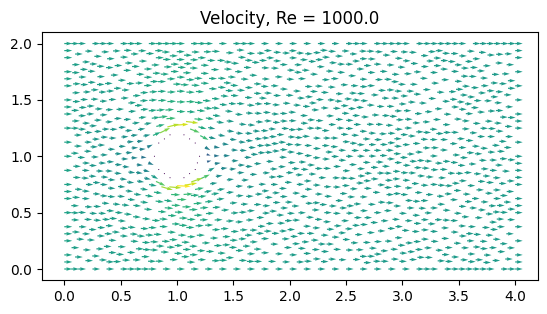

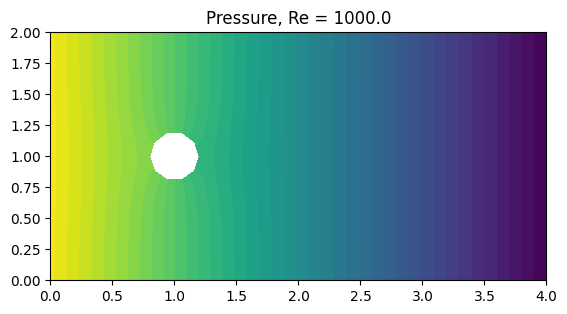

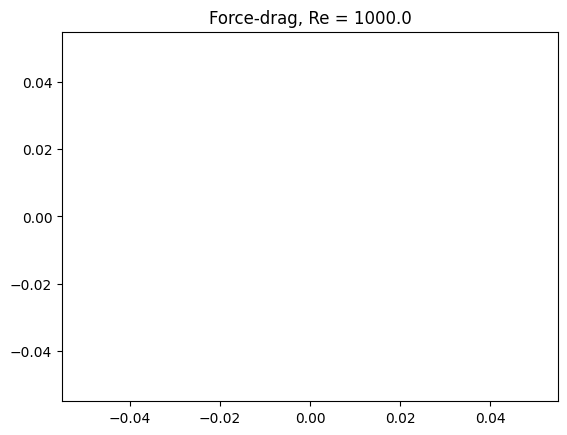

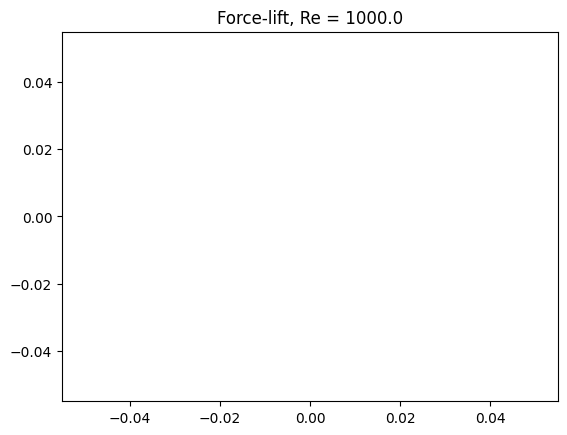

Time t = 3.022665674238231


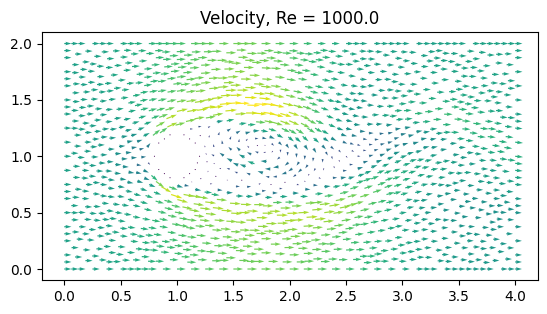

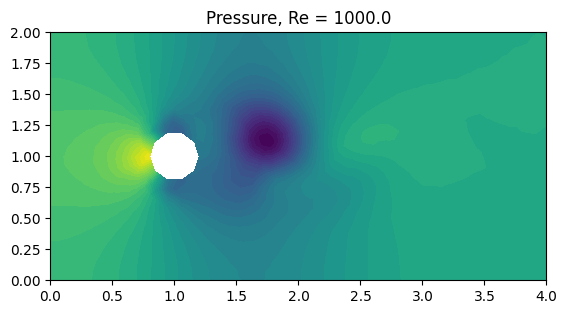

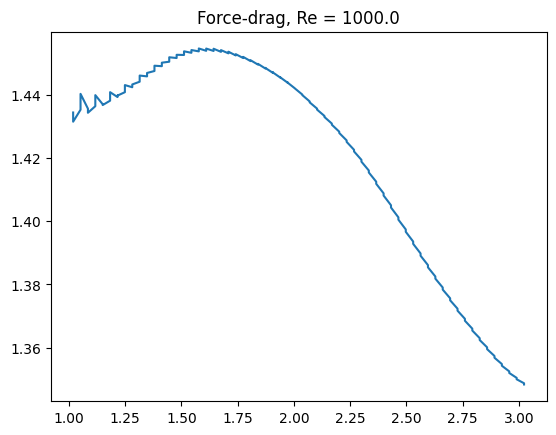

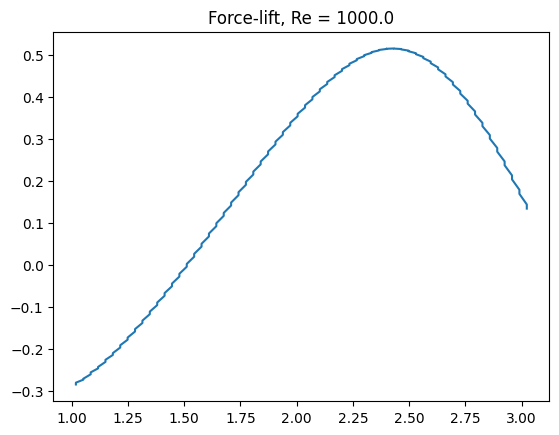

Time t = 6.012476286799972


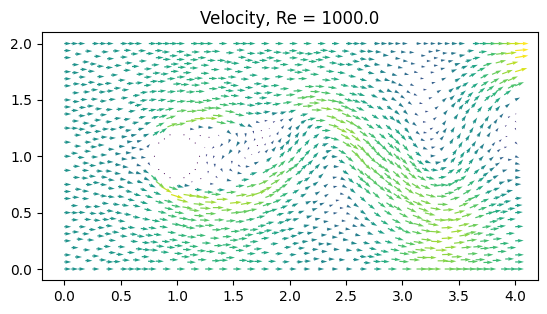

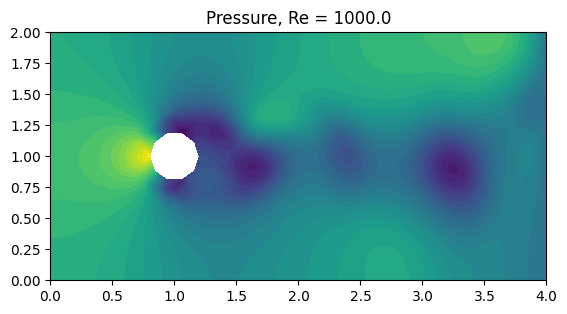

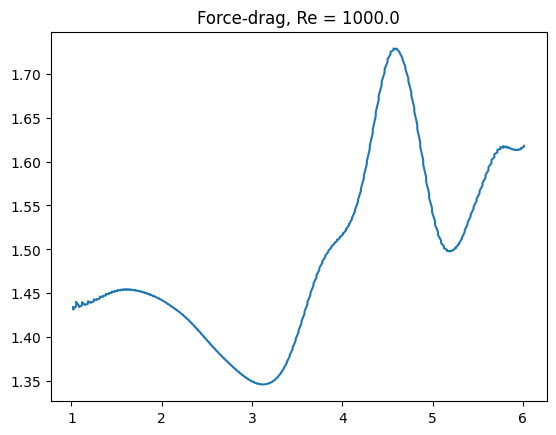

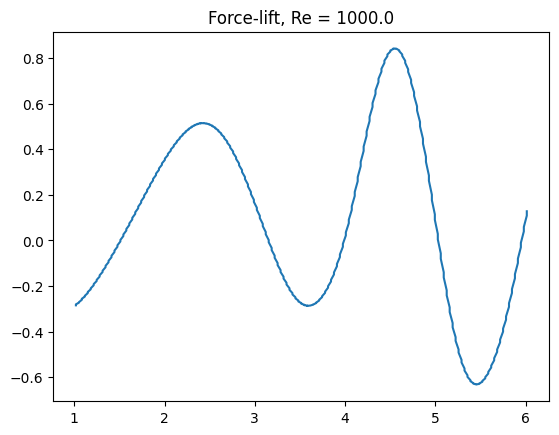

Time t = 9.002286899361685


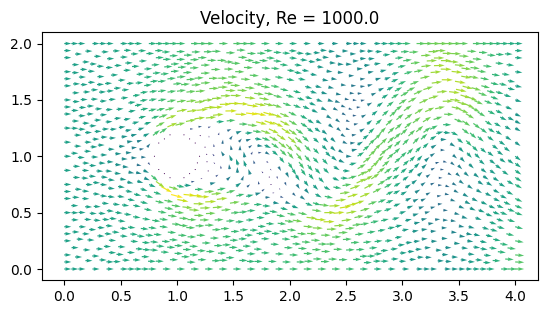

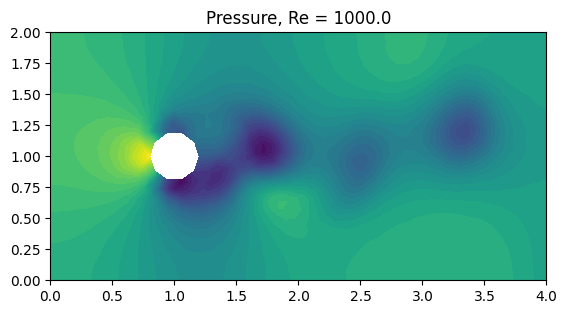

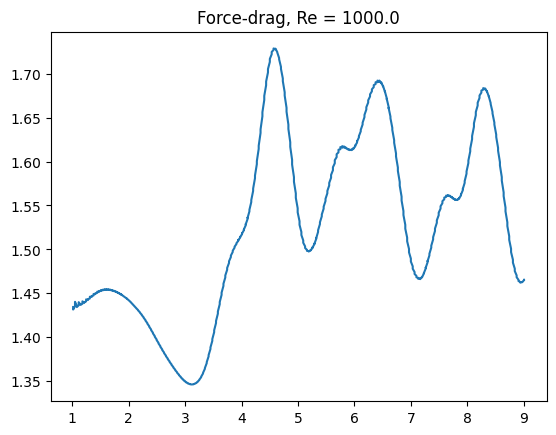

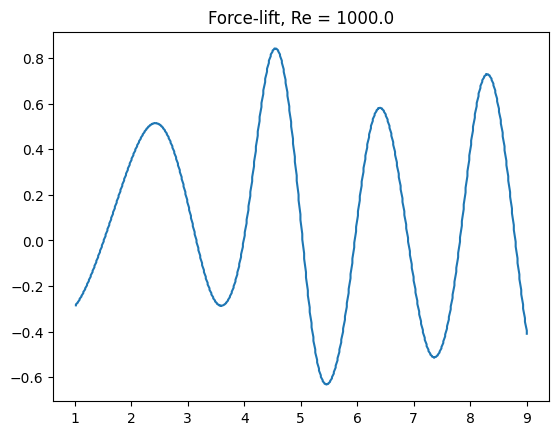

Time t = 12.024952573599847


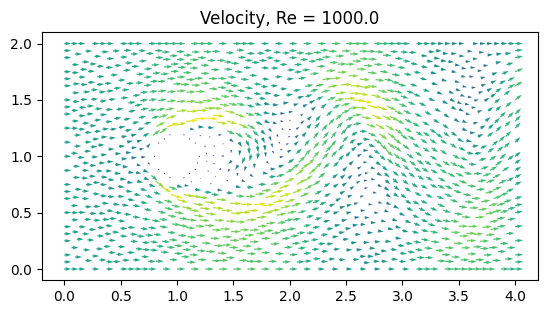

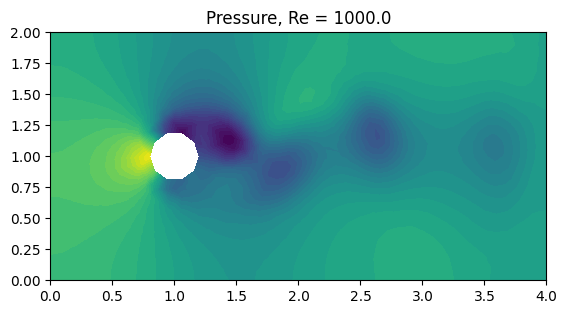

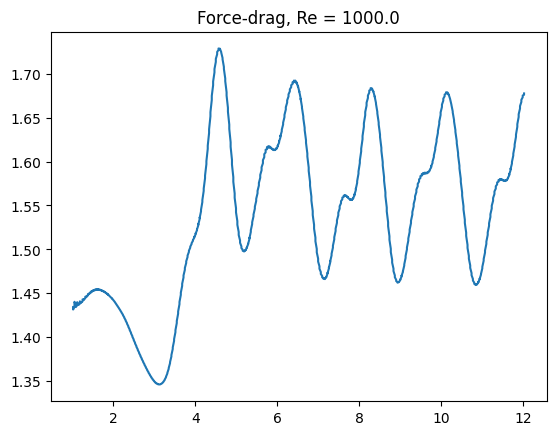

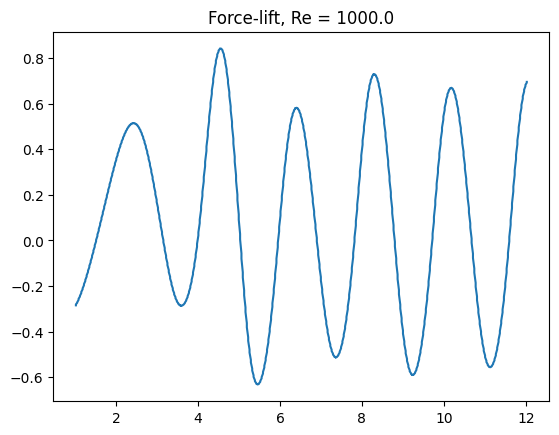

Time t = 15.014763186161508


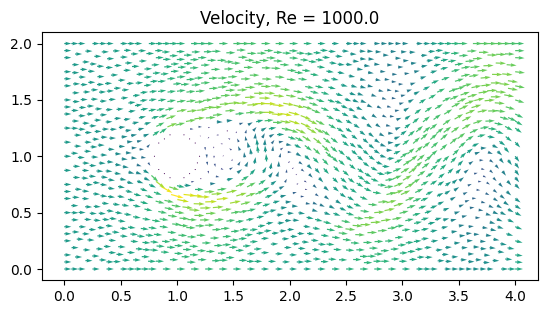

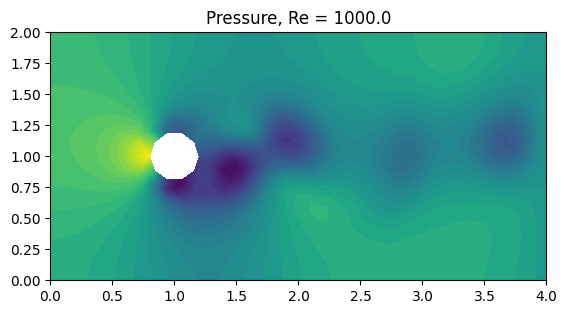

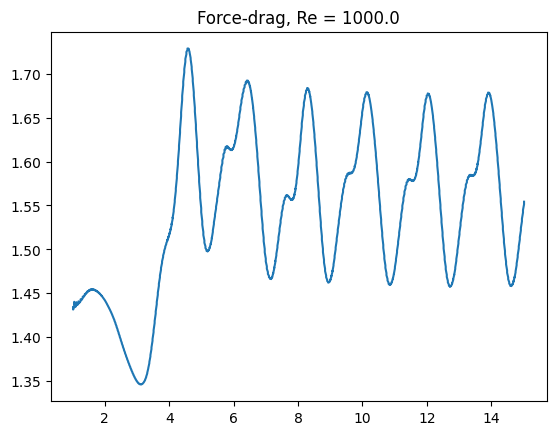

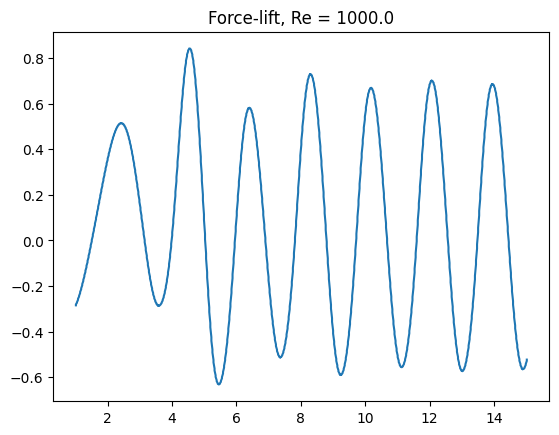

Time t = 18.00457379872328


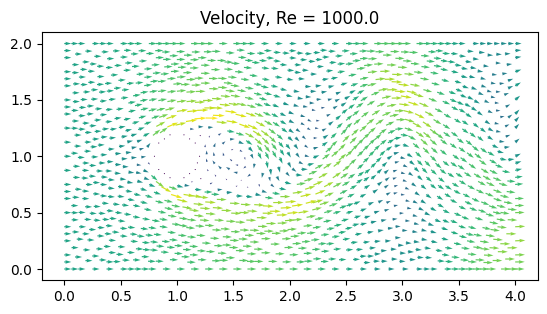

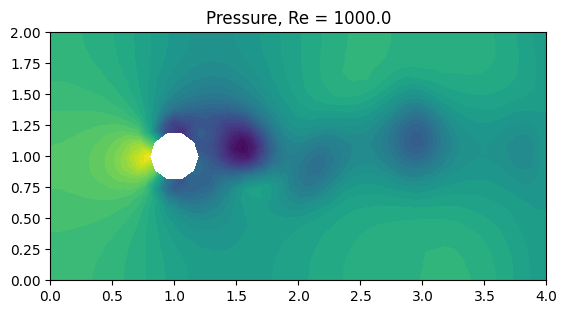

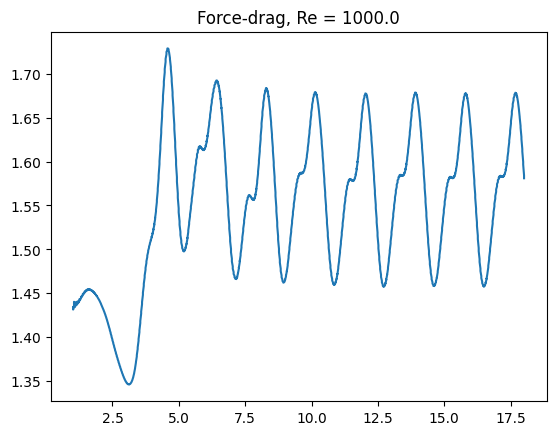

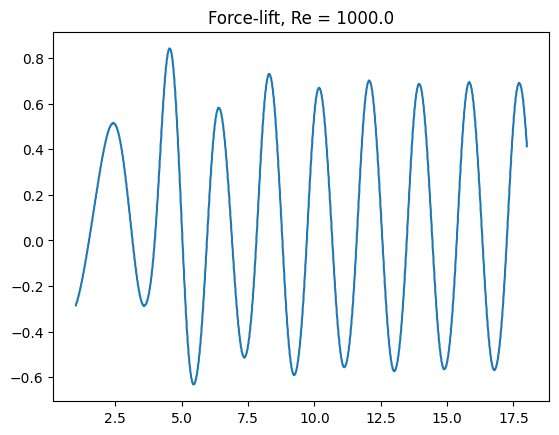

Time t = 21.027239472961604


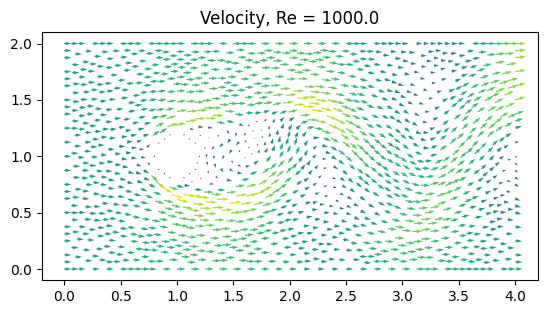

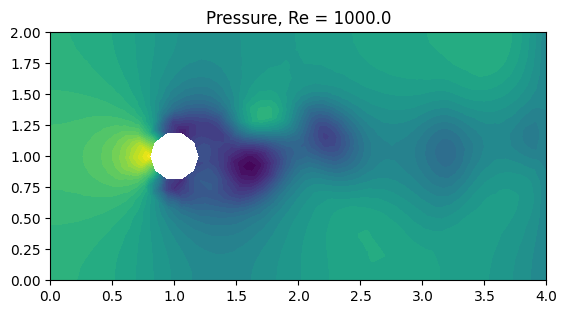

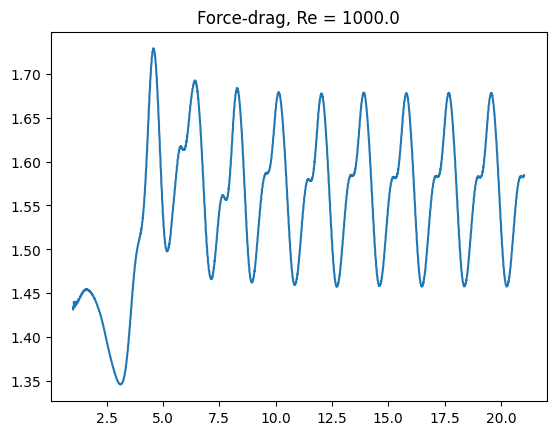

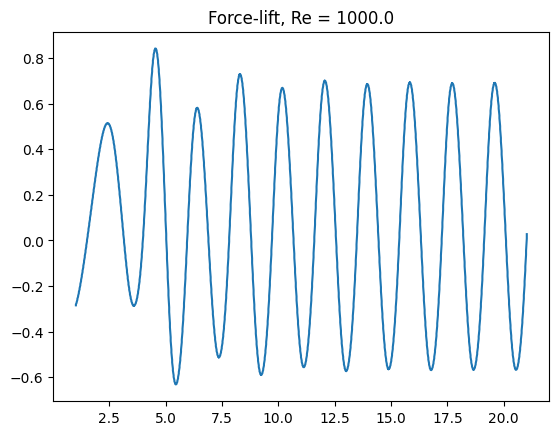

Time t = 24.017050085523426


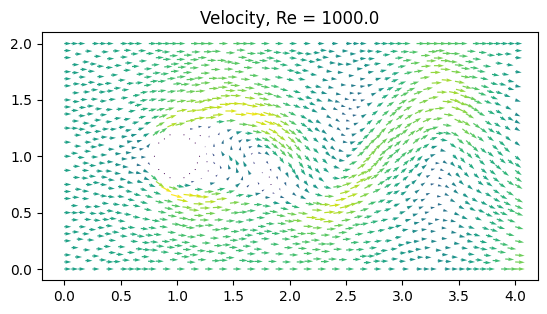

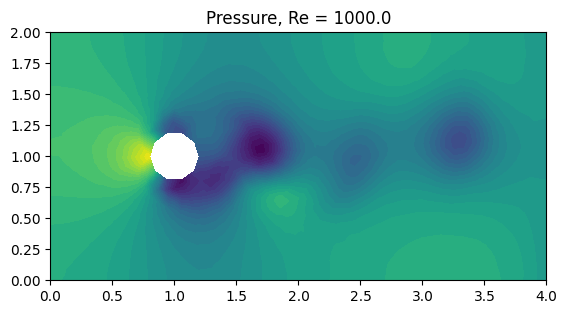

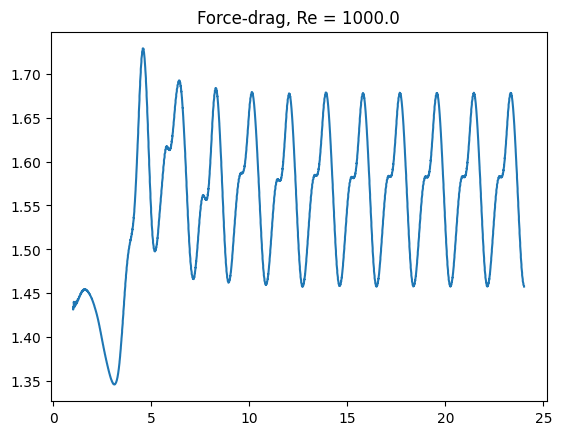

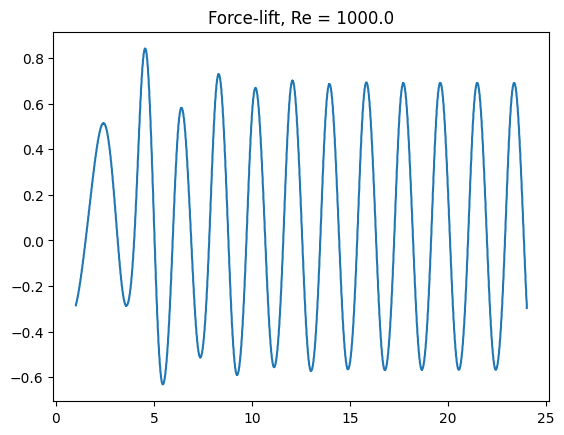

Time t = 27.006860698085248


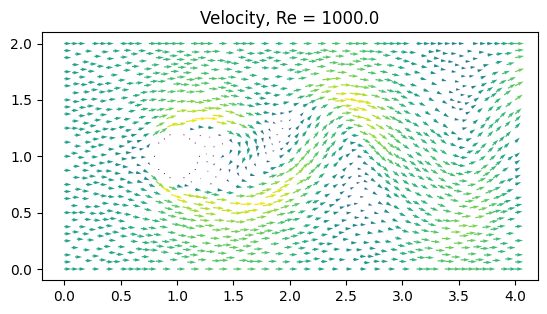

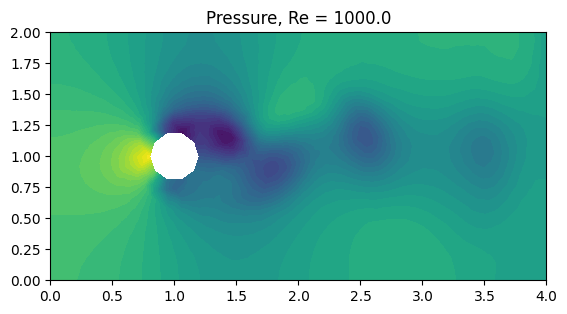

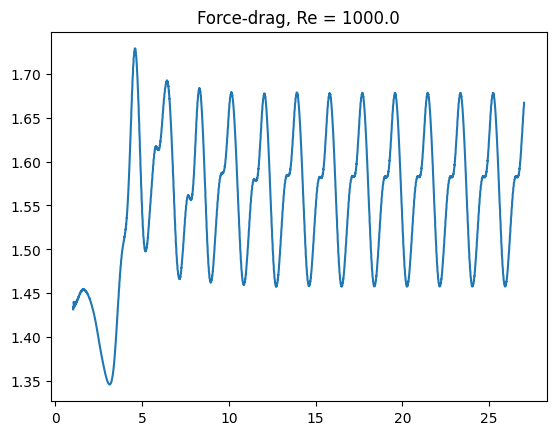

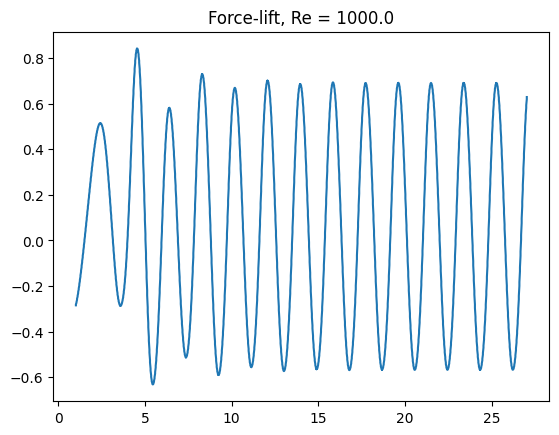

In [ ]:
time_step("32", 4.0e-4)

Plot the results for a resolution of $\frac{1}{32}$ and $\nu = 0.004$.

rm: cannot remove 'results-NS/*': No such file or directory


DEBUG:UFL:Blocks of each mode: 
  24	partial
DEBUG:UFL:Blocks of each mode: 
  6	full
DEBUG:UFL:Blocks of each mode: 
  1	full


Time t = 0.03285506167650246


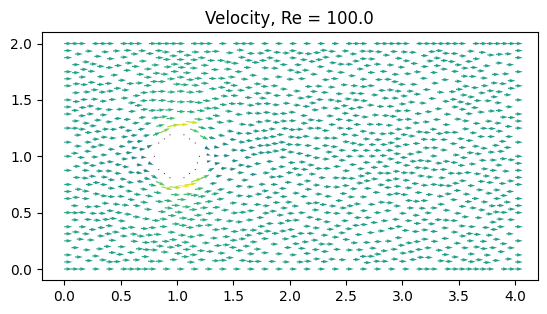

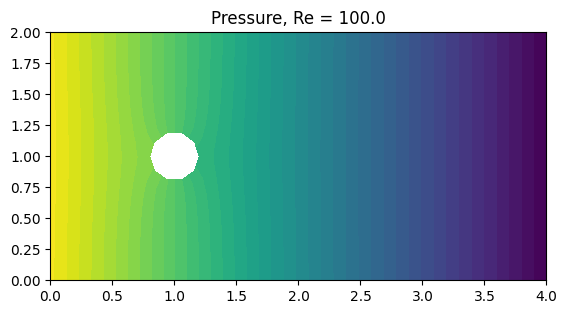

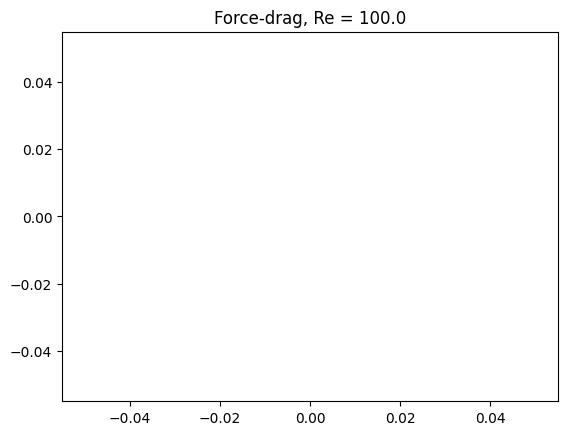

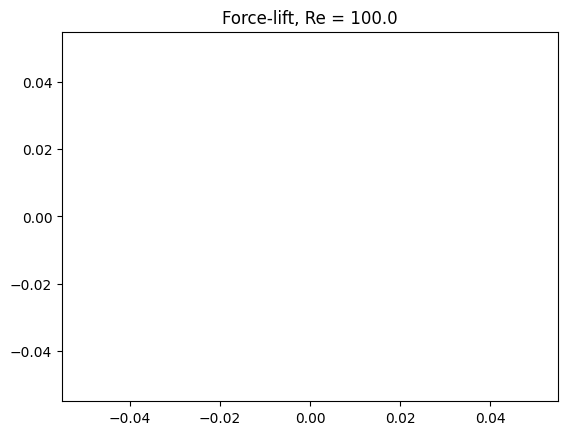

Time t = 3.022665674238231


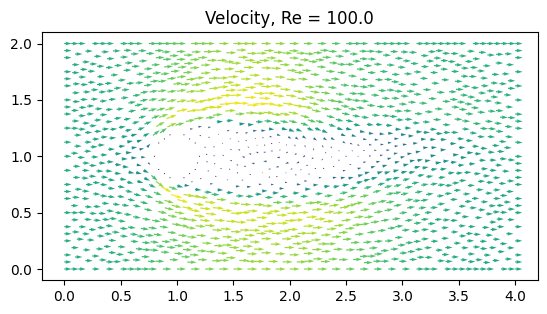

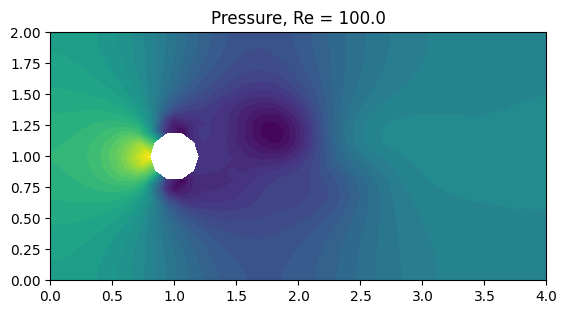

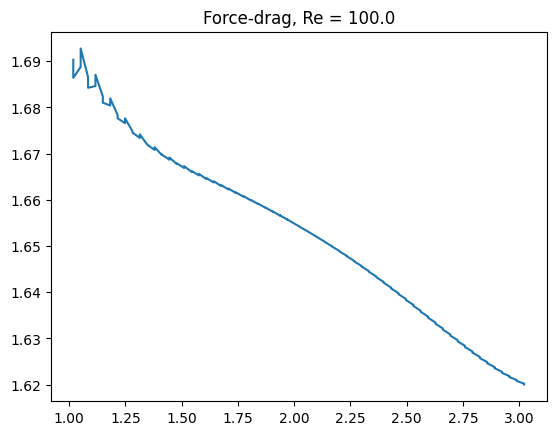

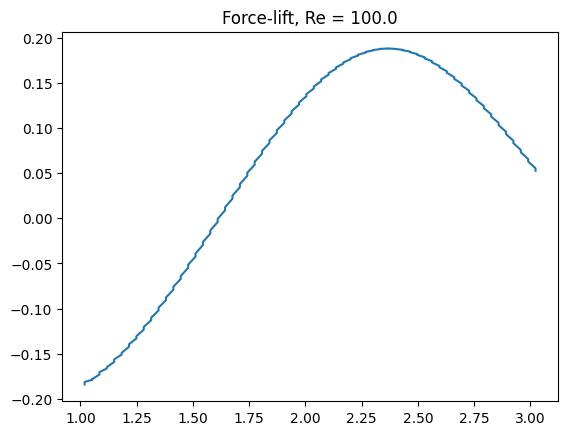

Time t = 6.012476286799972


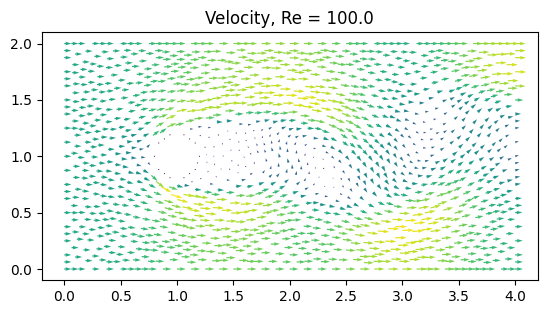

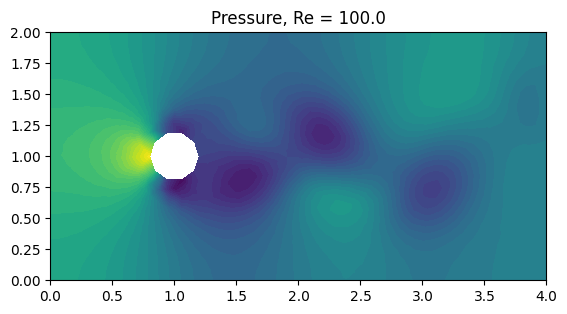

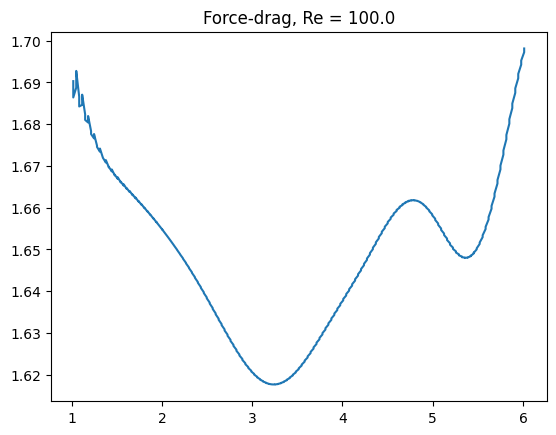

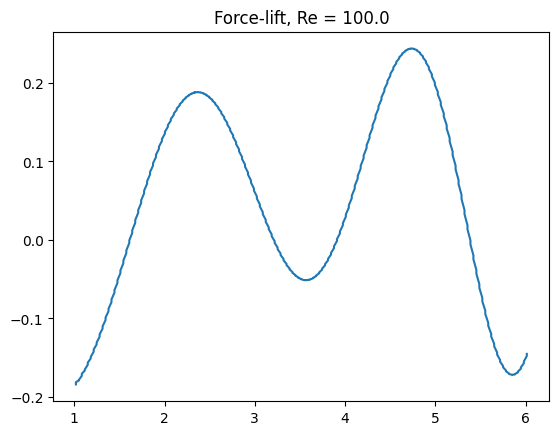

Time t = 9.002286899361685


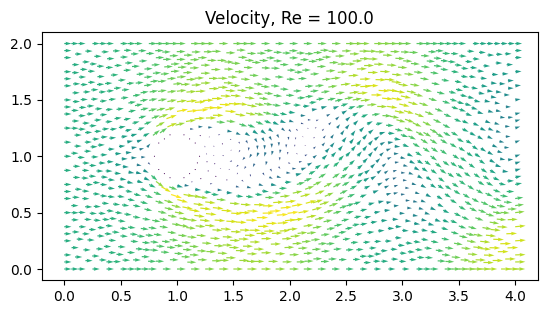

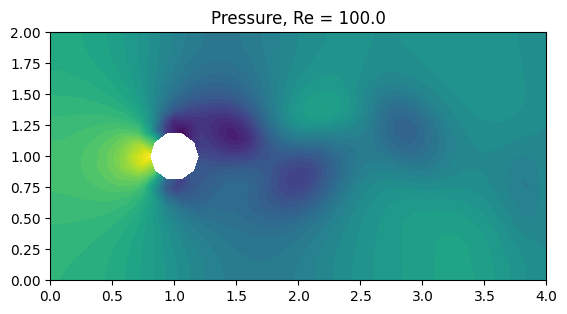

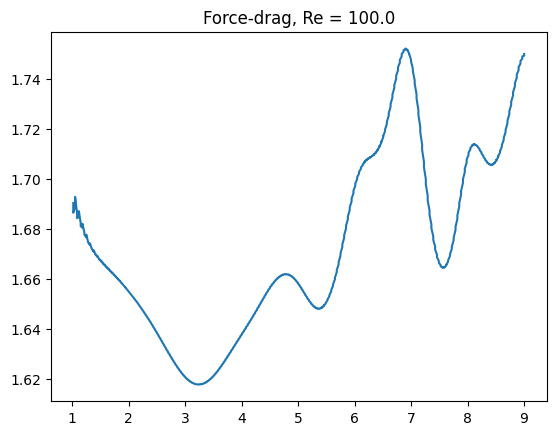

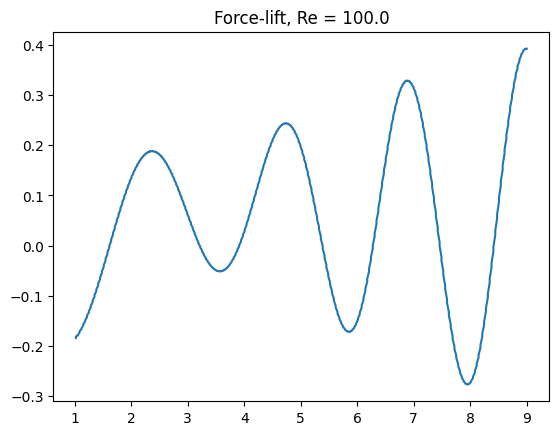

Time t = 12.024952573599847


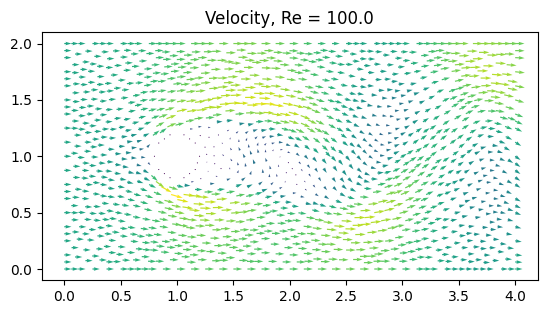

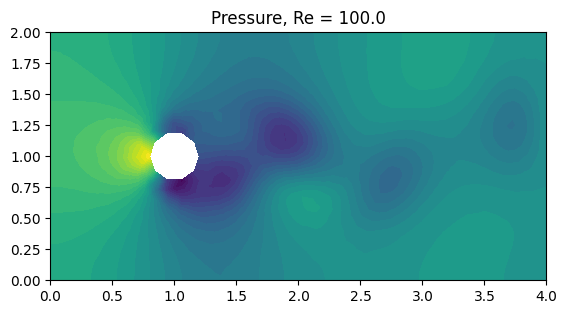

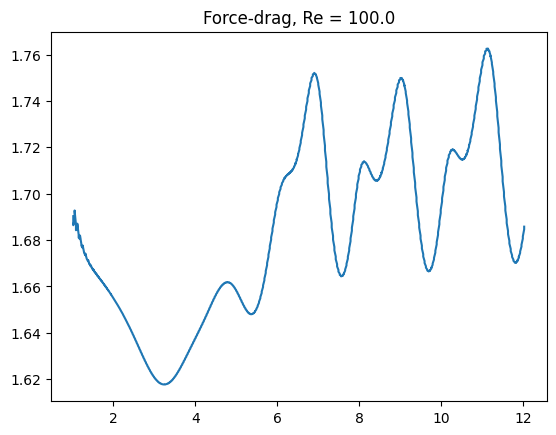

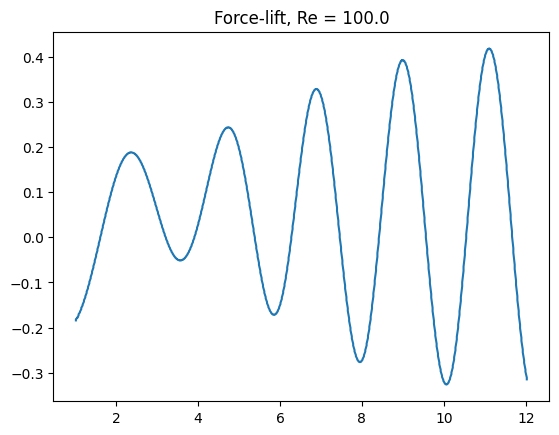

Time t = 15.014763186161508


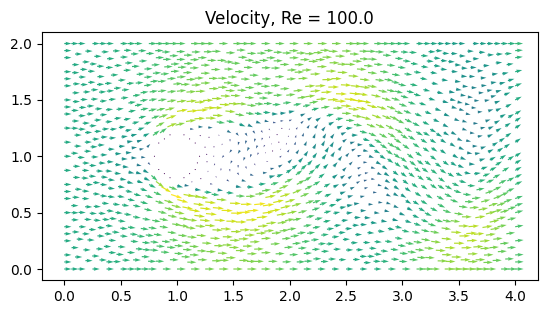

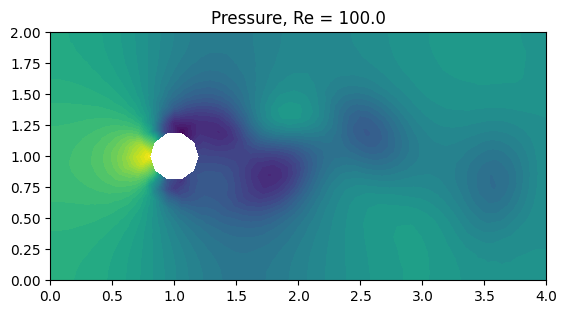

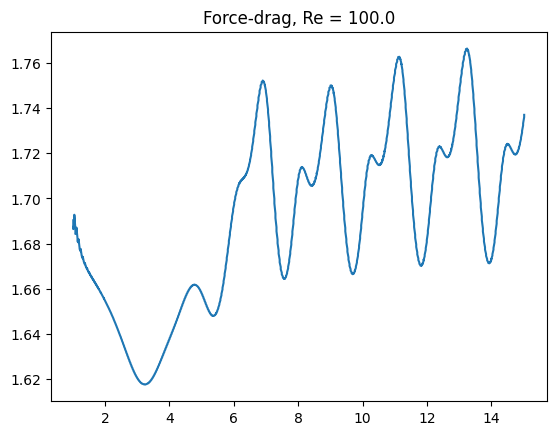

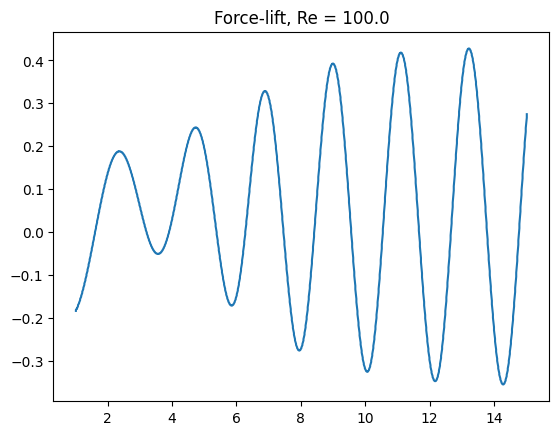

Time t = 18.00457379872328


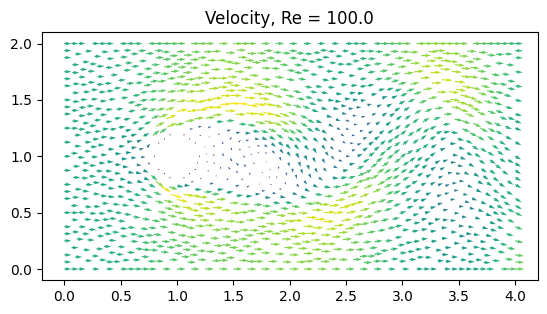

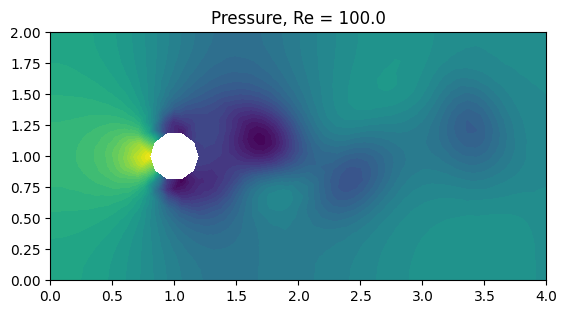

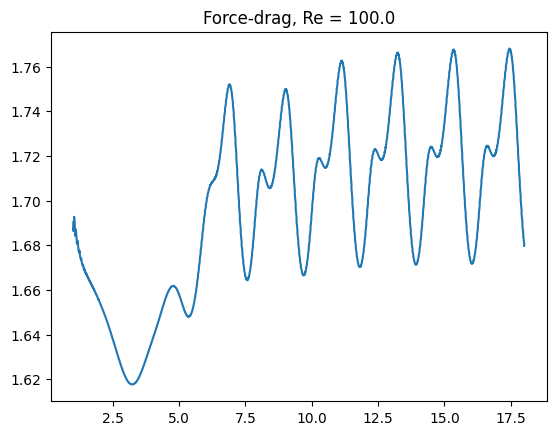

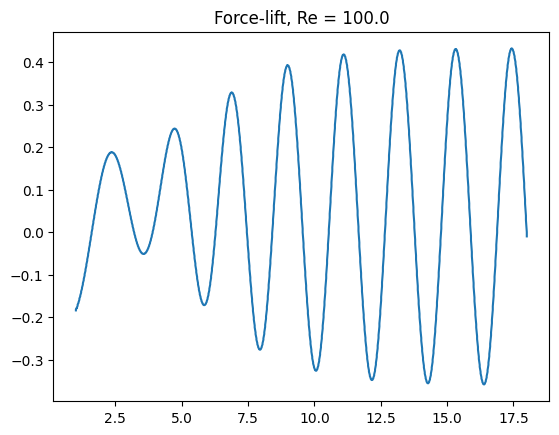

Time t = 21.027239472961604


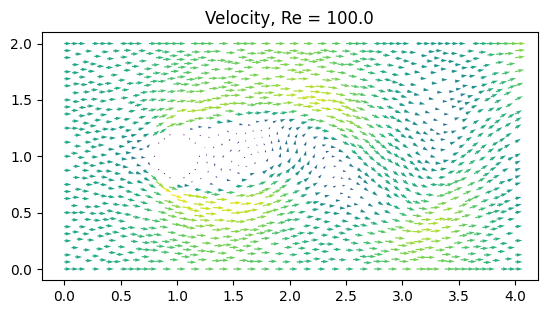

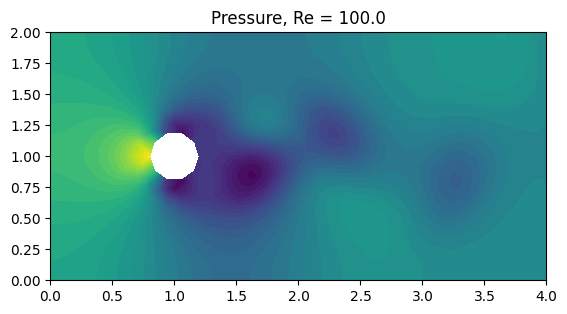

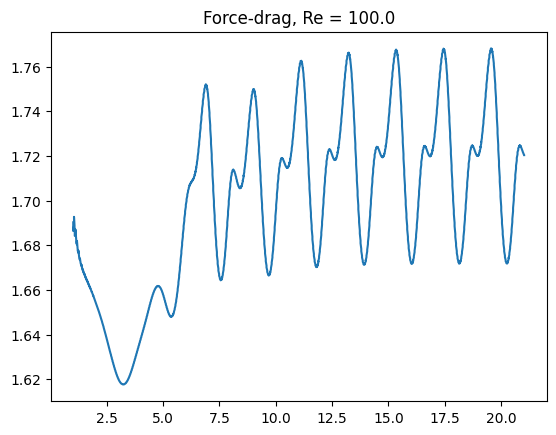

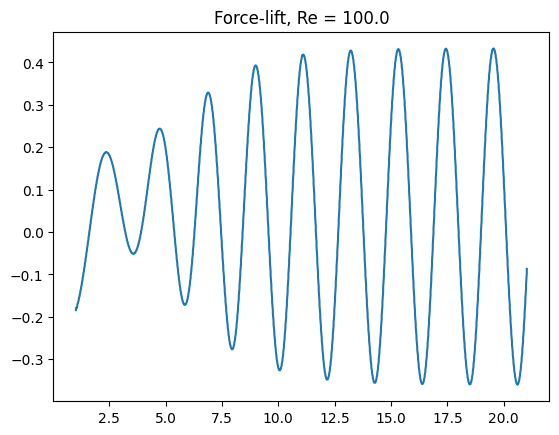

Time t = 24.017050085523426


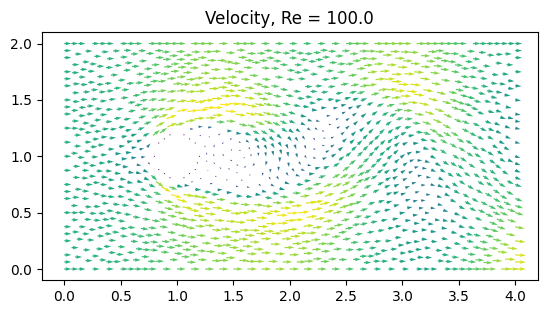

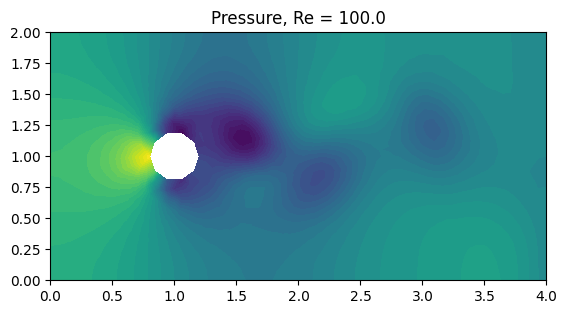

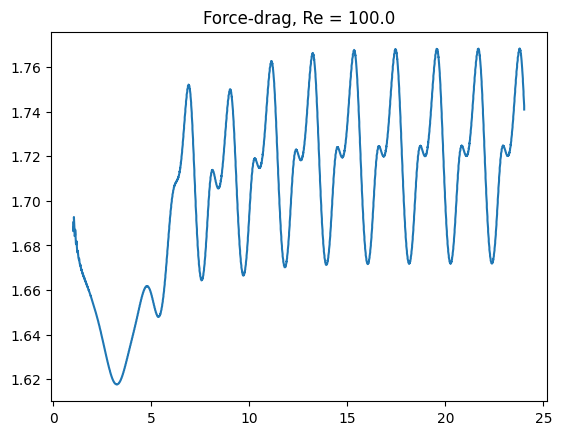

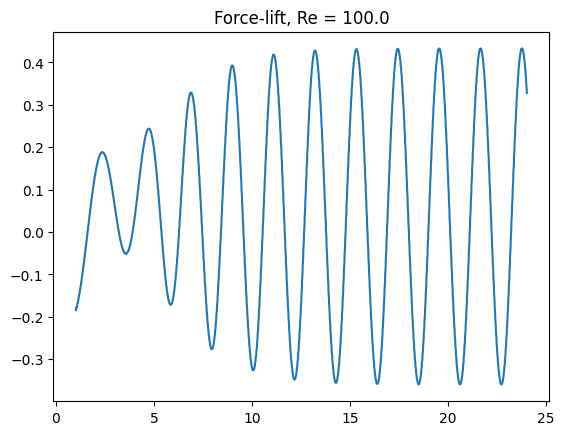

Time t = 27.006860698085248


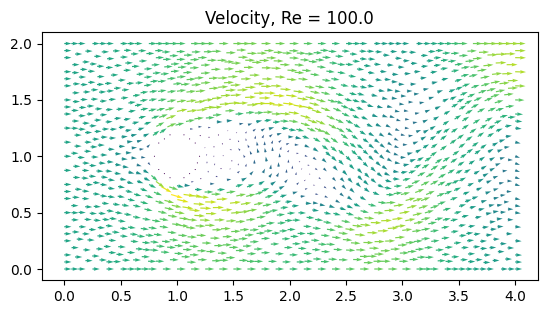

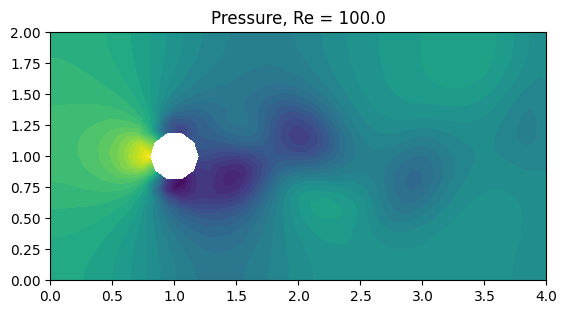

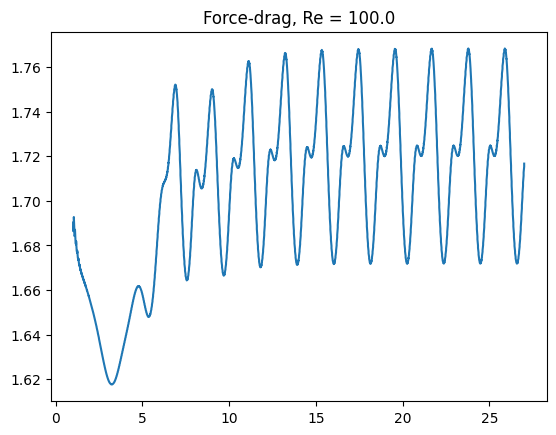

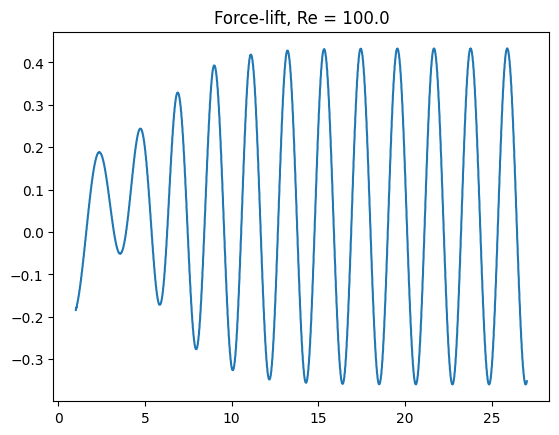

In [ ]:
time_step("32", 4.0e-3)

Plot the results for a resolution of $\frac{1}{32}$ and $\nu = 0.04$.

rm: cannot remove 'results-NS/*': No such file or directory


DEBUG:UFL:Blocks of each mode: 
  24	partial
DEBUG:UFL:Blocks of each mode: 
  6	full
DEBUG:UFL:Blocks of each mode: 
  1	full


Time t = 0.03285506167650246


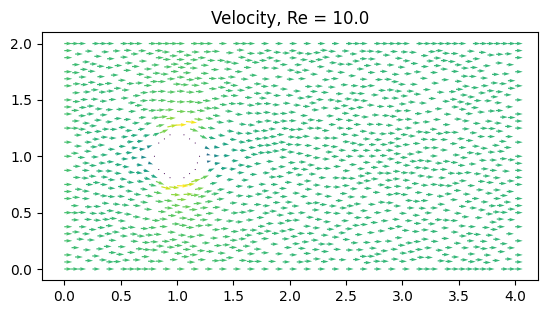

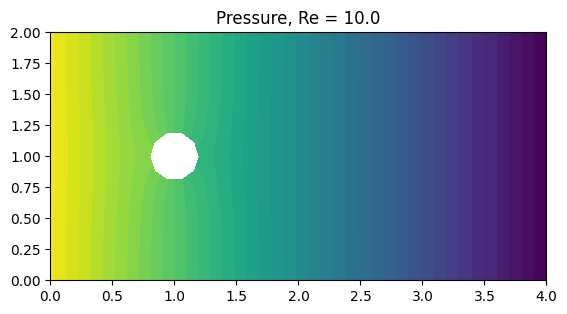

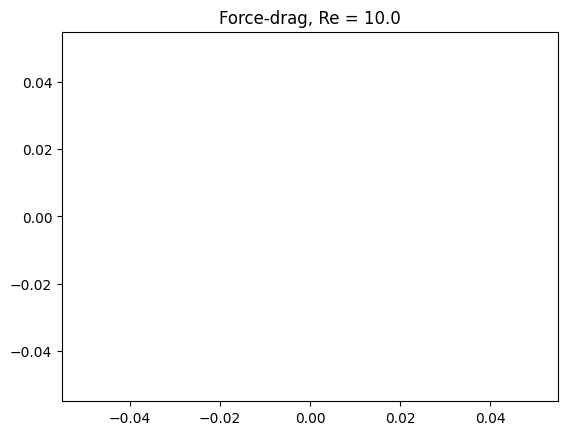

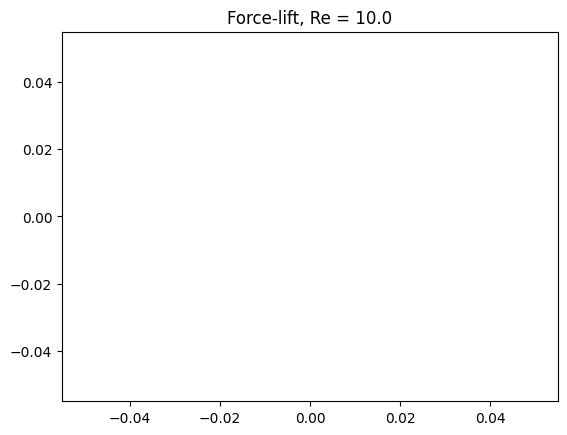

Time t = 3.022665674238231


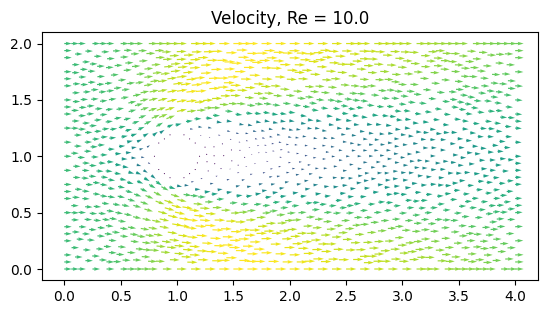

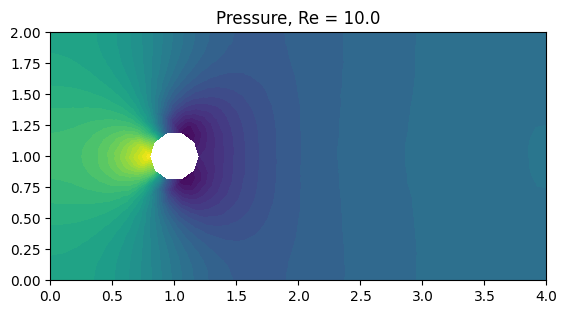

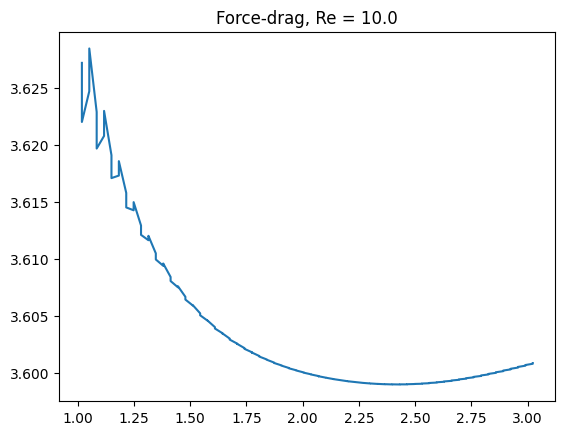

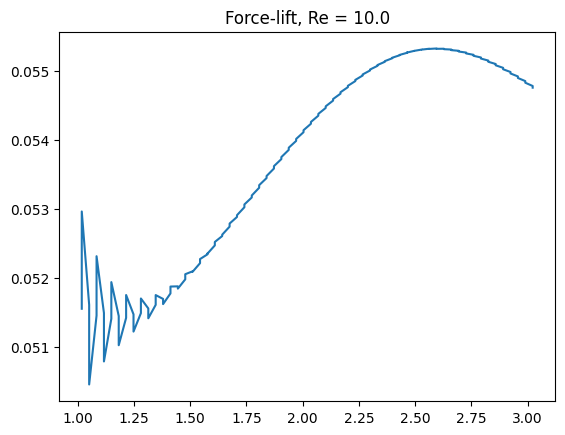

Time t = 6.012476286799972


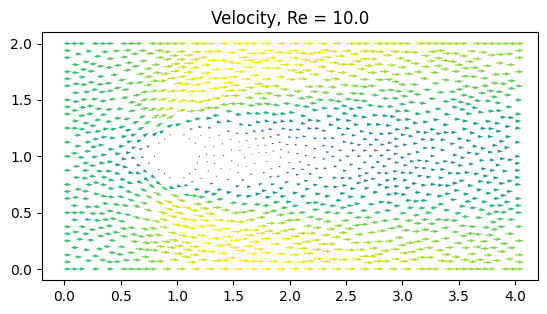

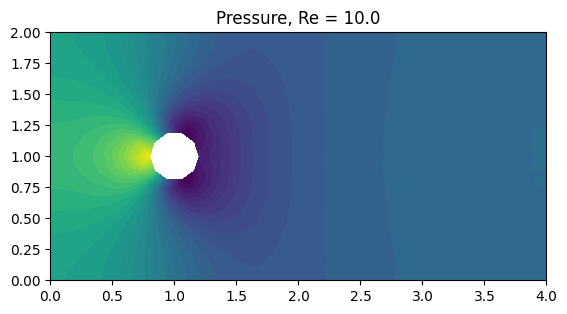

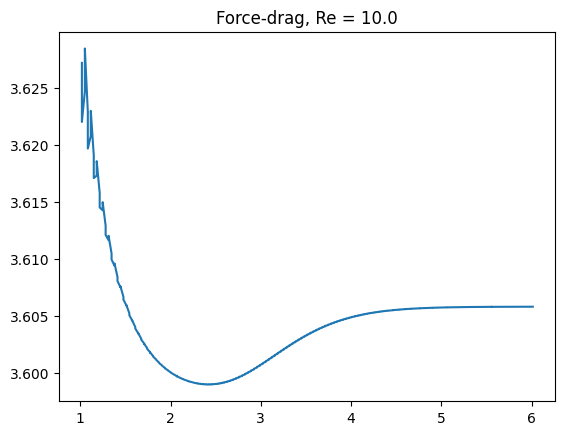

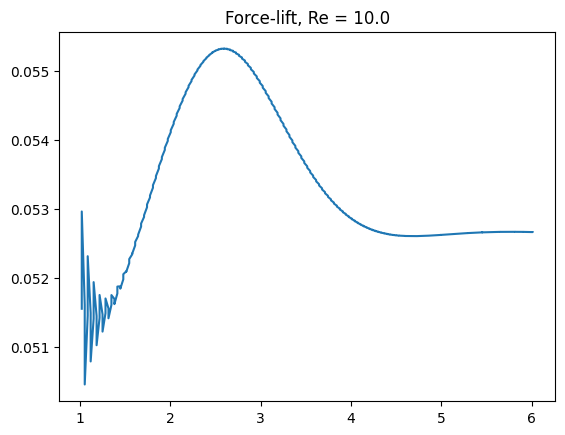

Time t = 9.002286899361685


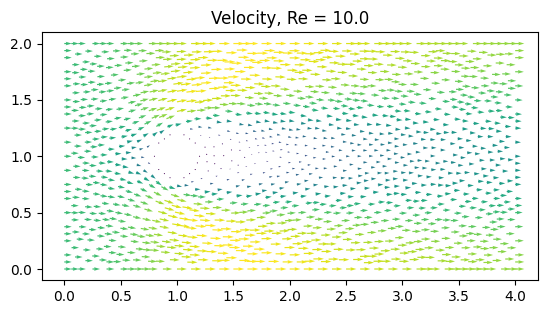

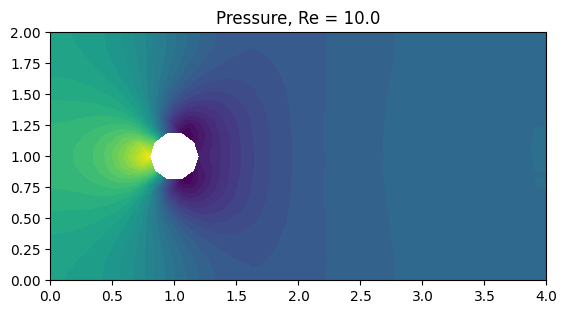

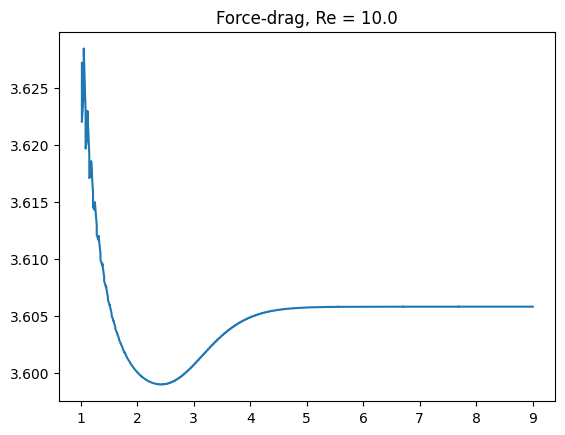

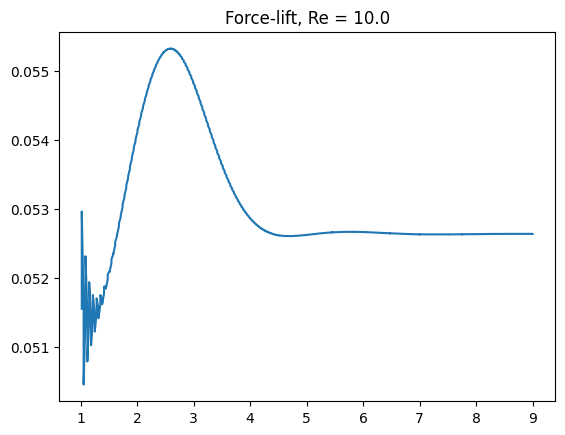

Time t = 12.024952573599847


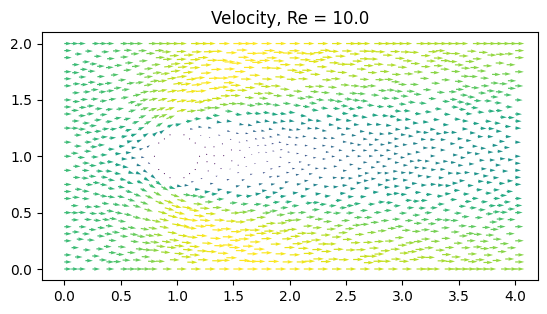

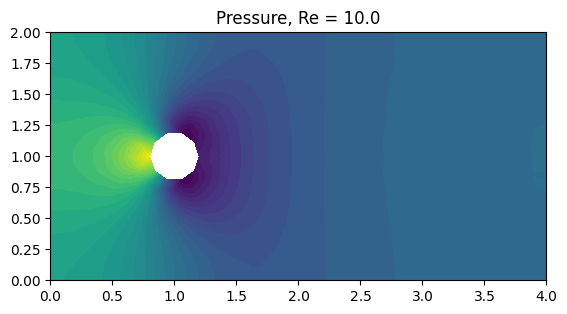

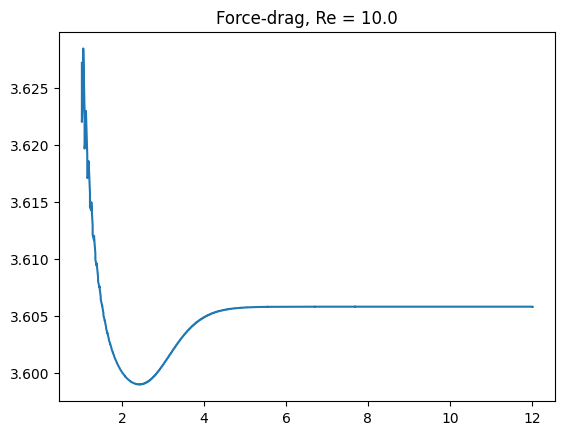

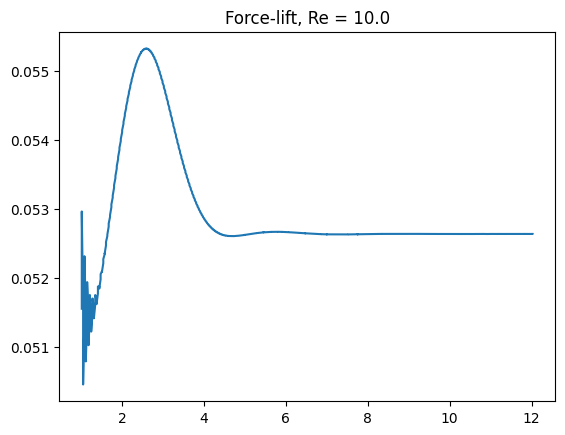

Time t = 15.014763186161508


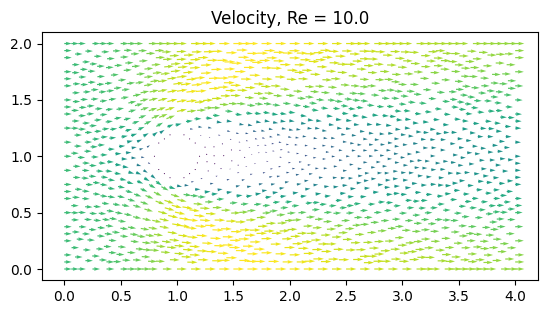

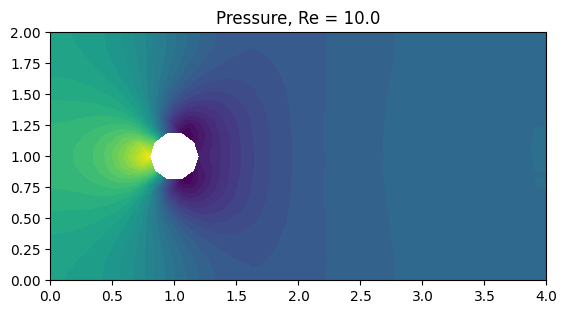

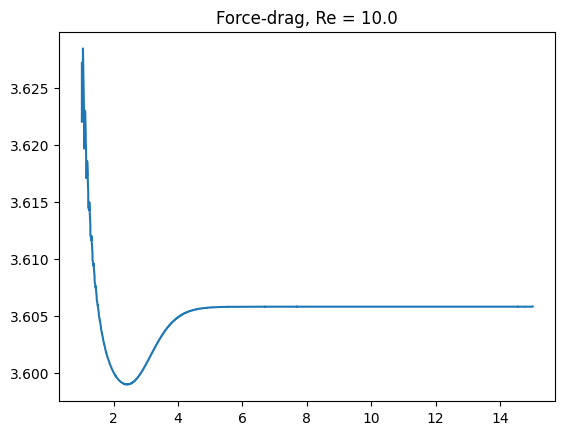

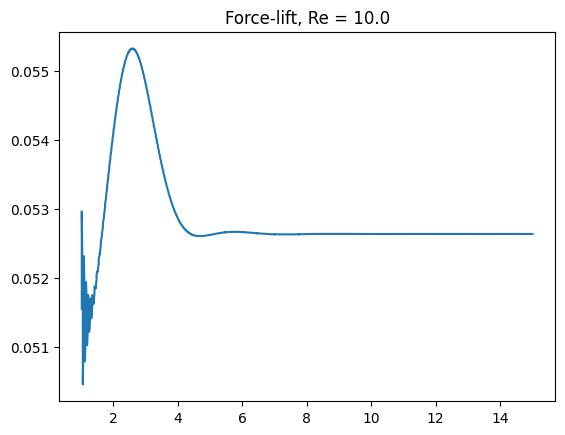

Time t = 18.00457379872328


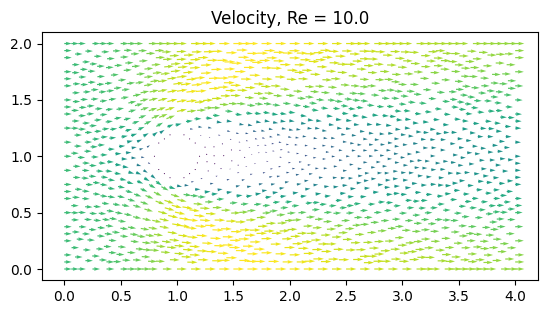

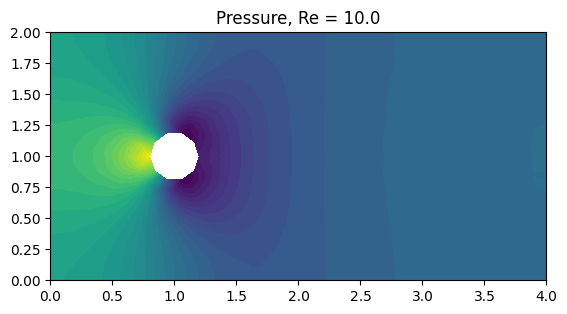

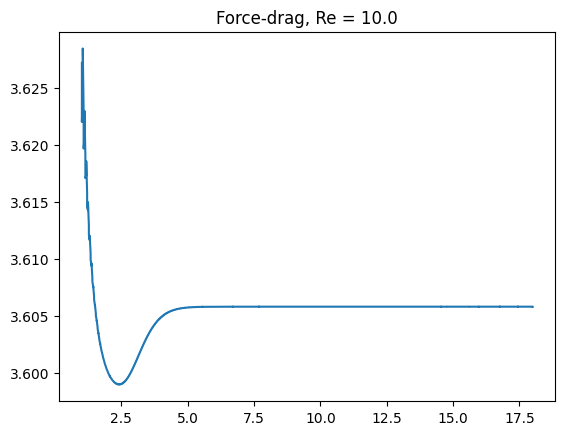

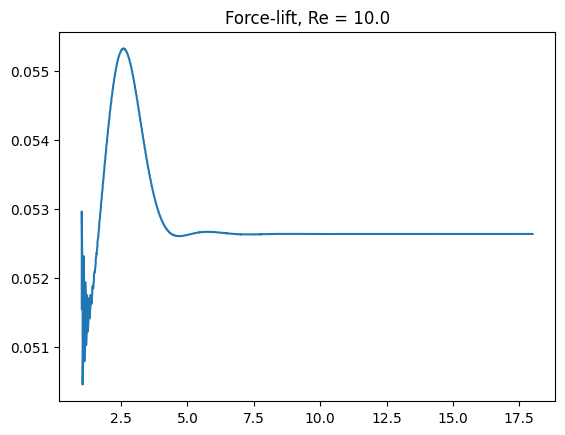

Time t = 21.027239472961604


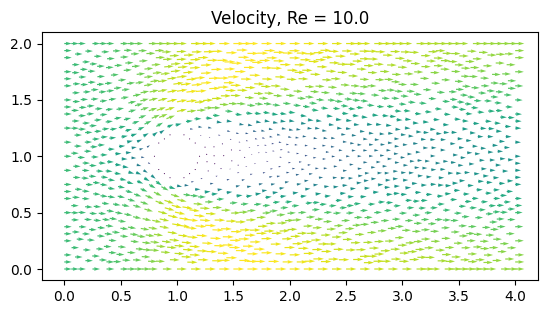

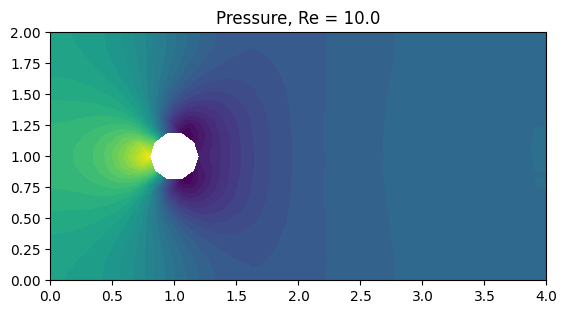

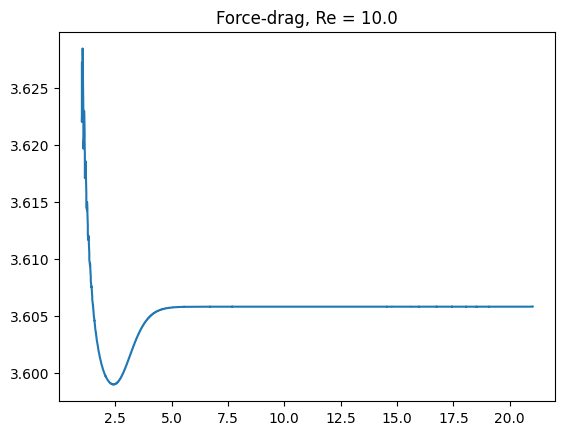

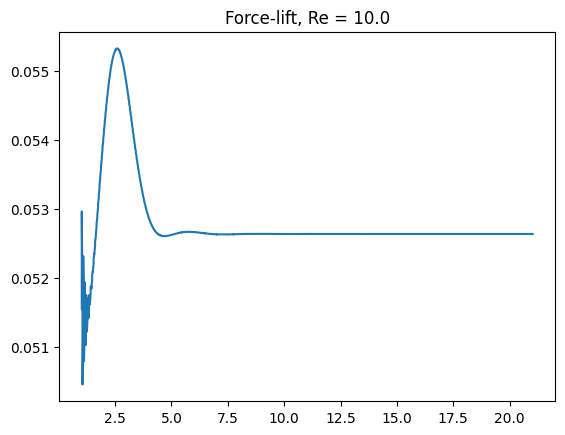

Time t = 24.017050085523426


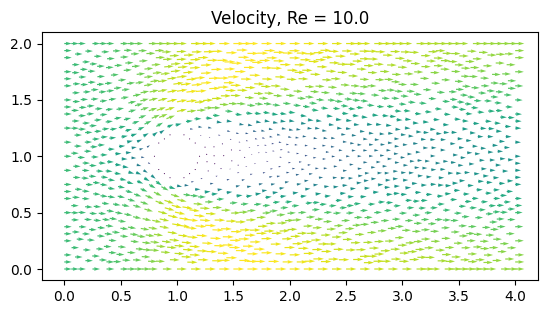

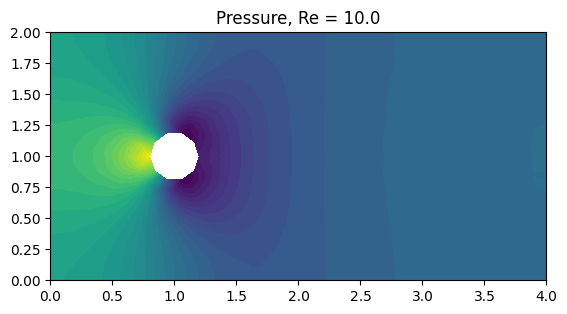

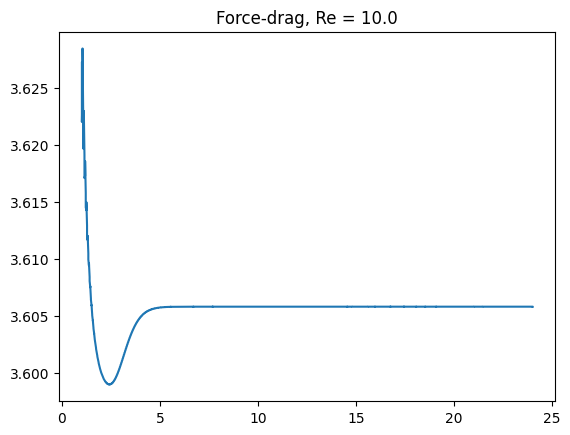

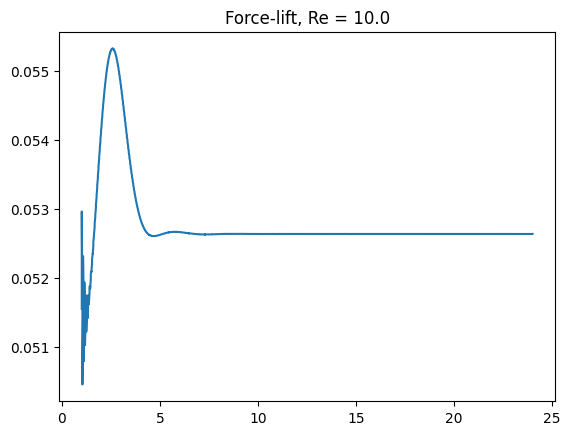

Time t = 27.006860698085248


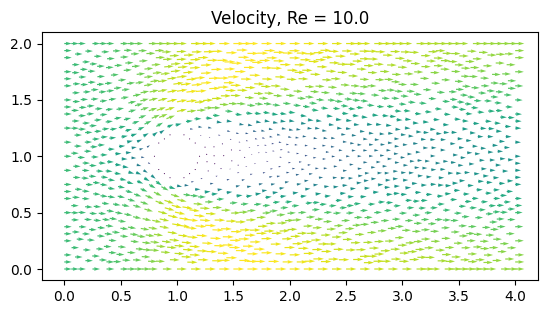

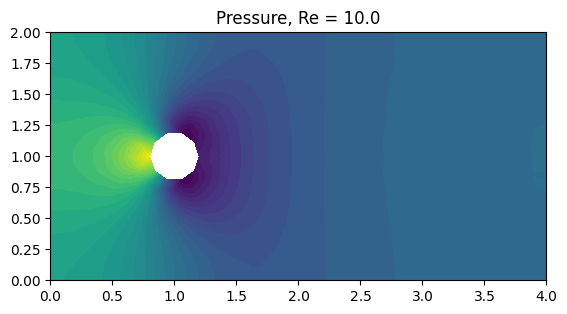

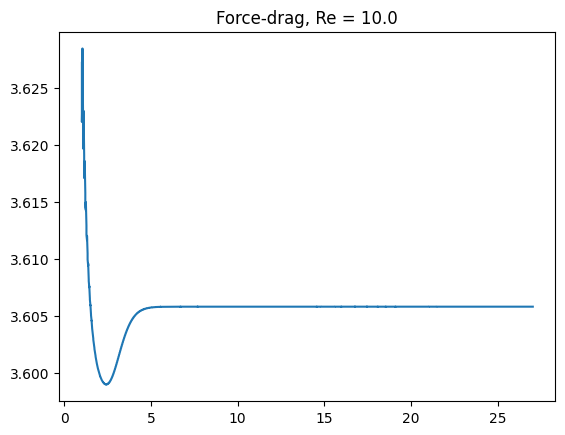

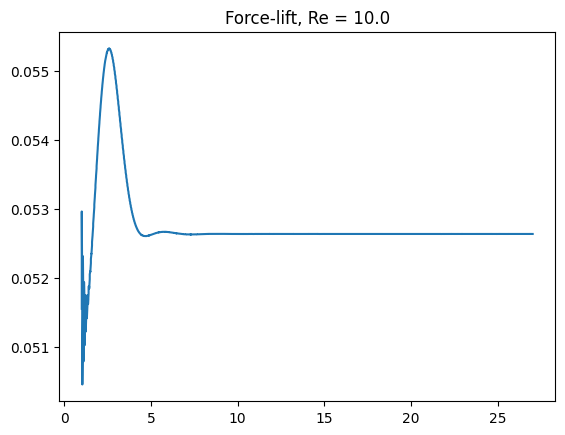

In [ ]:
time_step("32", 4.0e-2)

Plot the results for a resolution of $\frac{1}{32}$ and $\nu = 0.4$.

rm: cannot remove 'results-NS/*': No such file or directory


DEBUG:UFL:Blocks of each mode: 
  24	partial
DEBUG:UFL:Blocks of each mode: 
  6	full
DEBUG:UFL:Blocks of each mode: 
  1	full


Time t = 0.03285506167650246


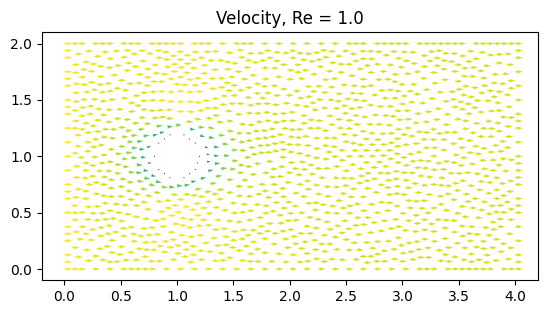

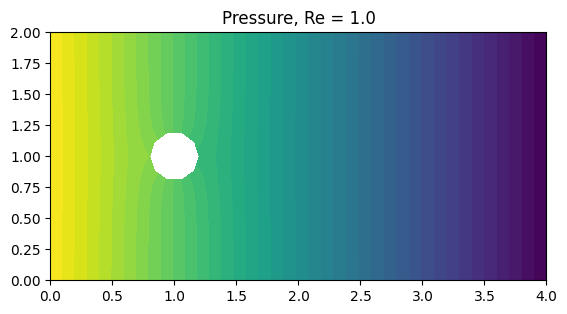

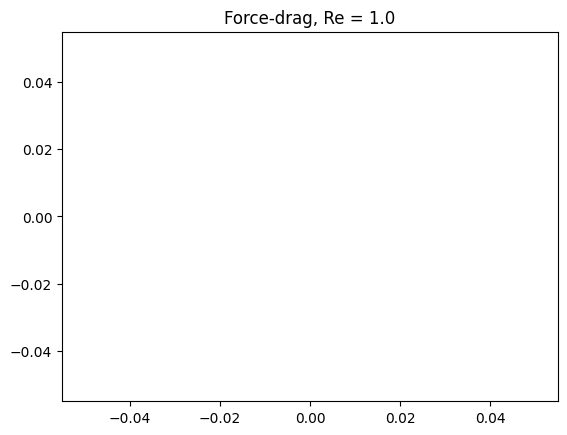

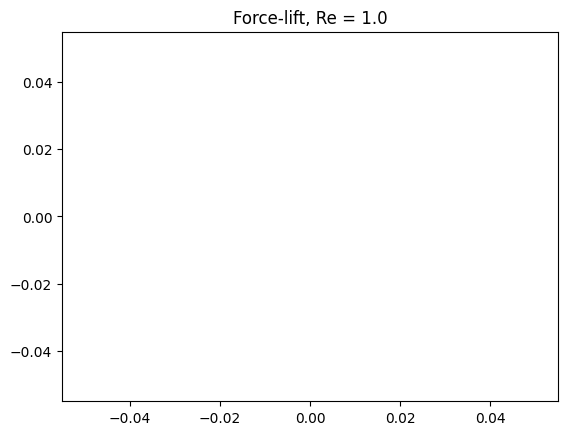

Time t = 3.022665674238231


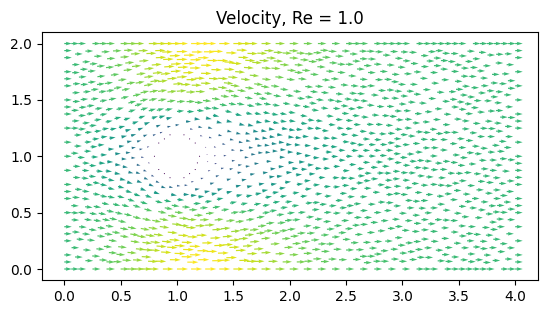

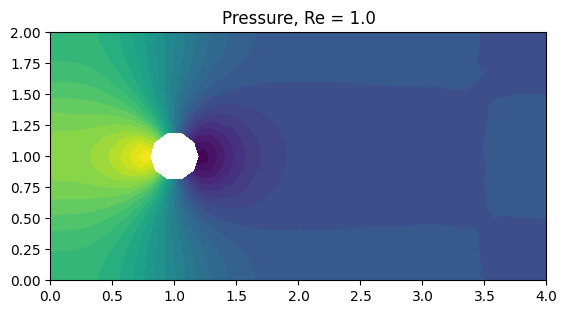

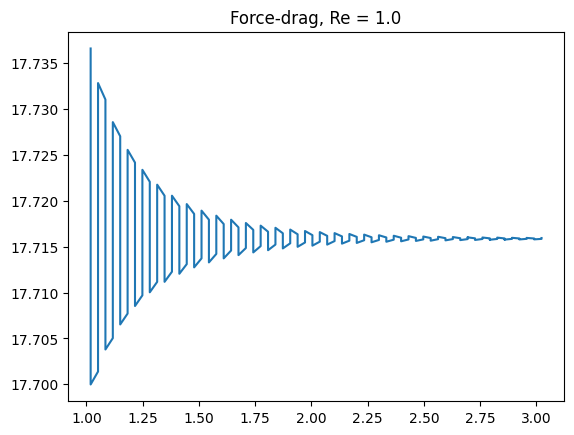

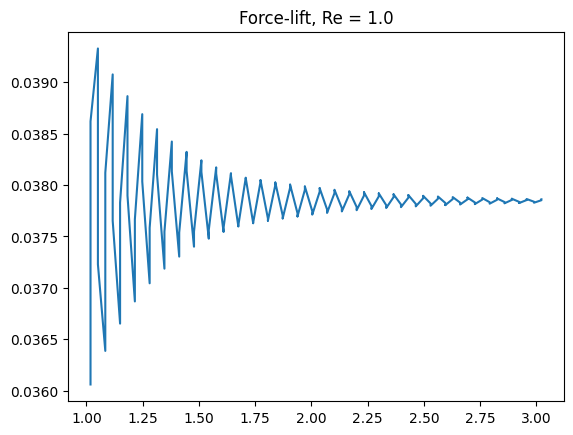

Time t = 6.012476286799972


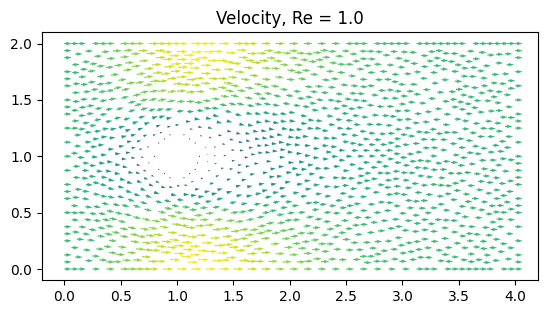

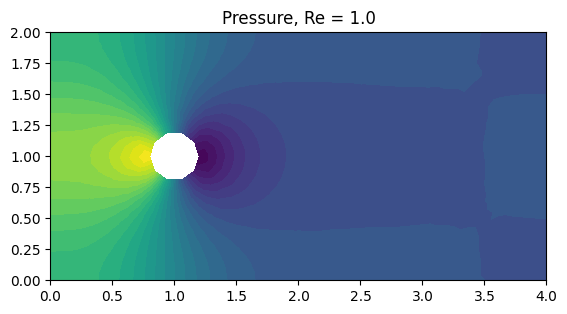

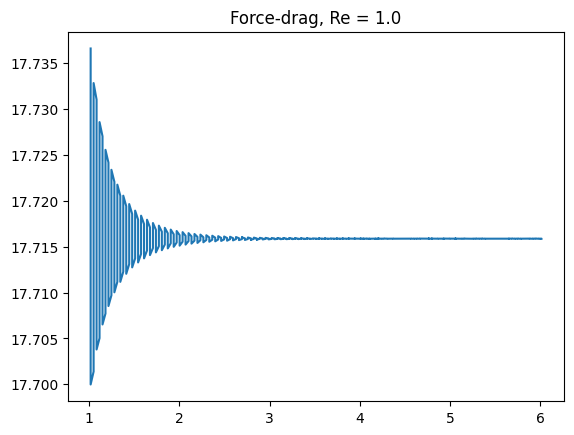

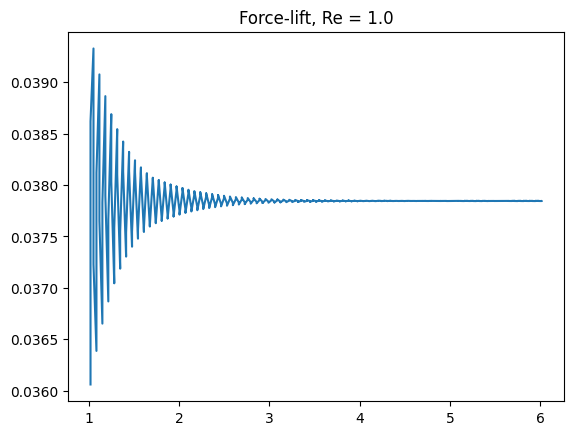

Time t = 9.002286899361685


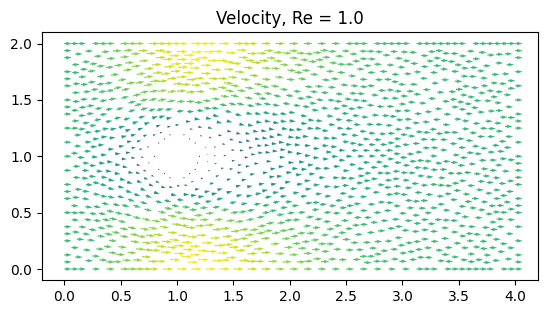

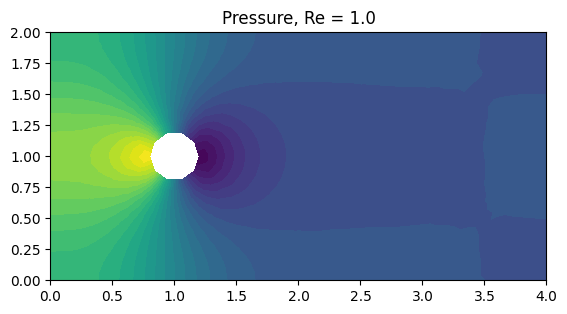

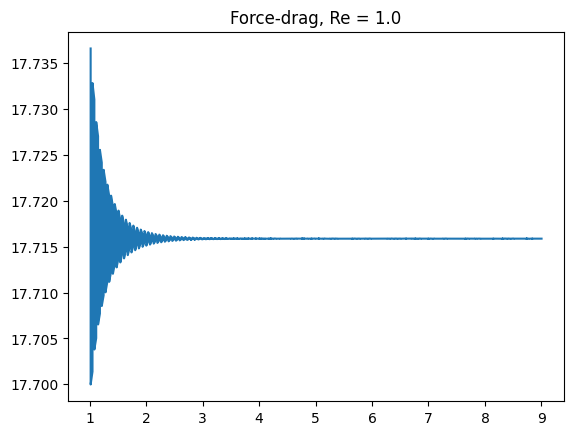

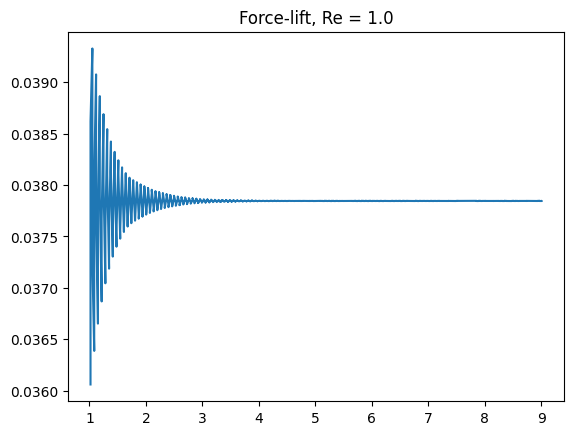

Time t = 12.024952573599847


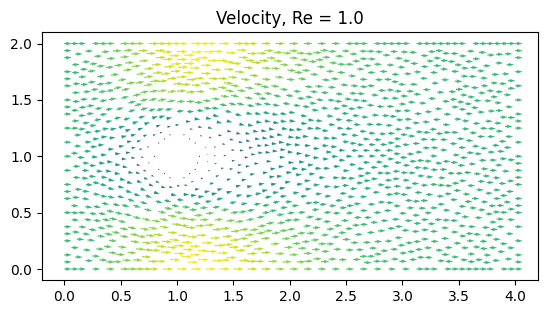

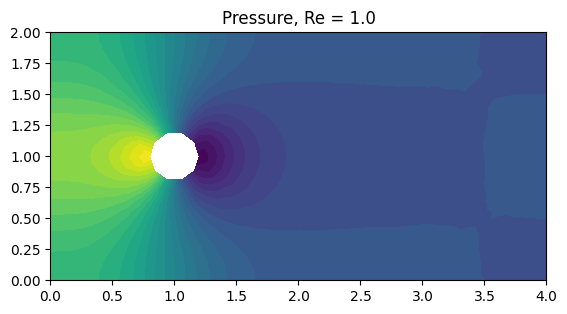

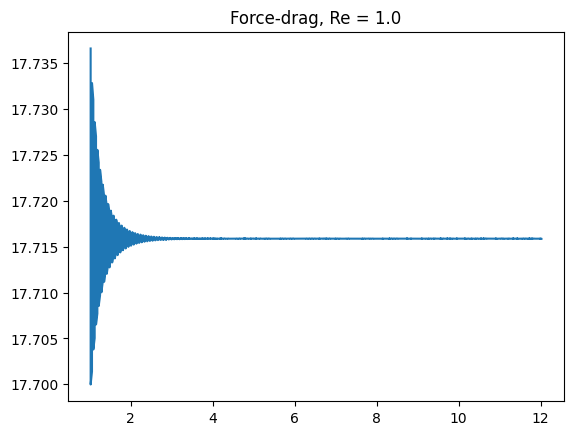

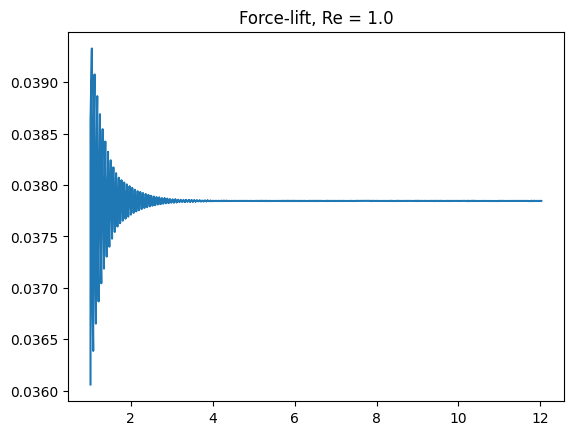

Time t = 15.014763186161508


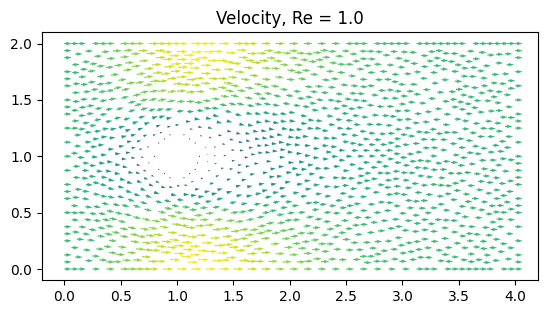

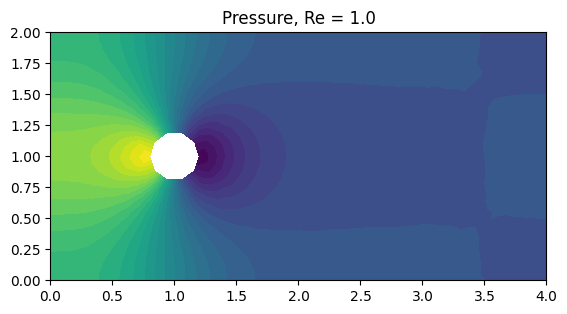

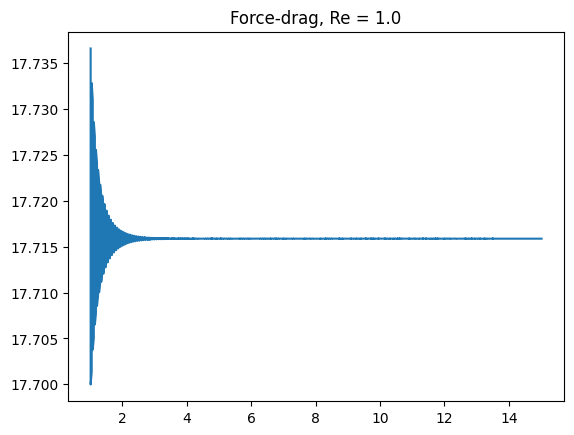

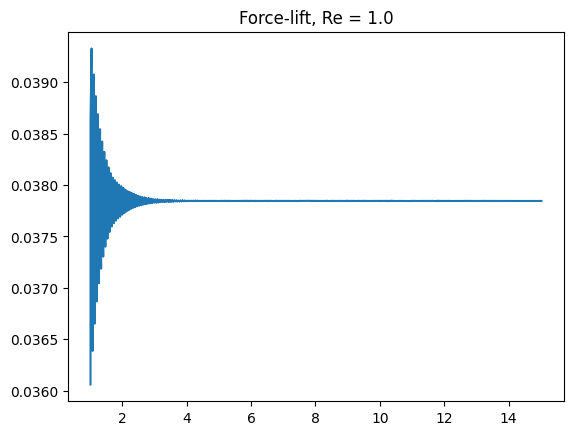

Time t = 18.00457379872328


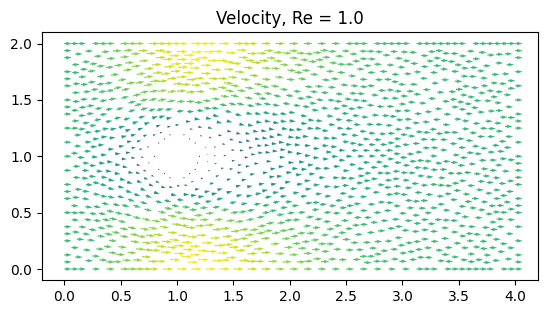

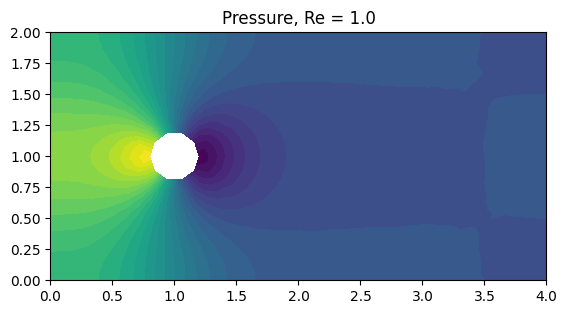

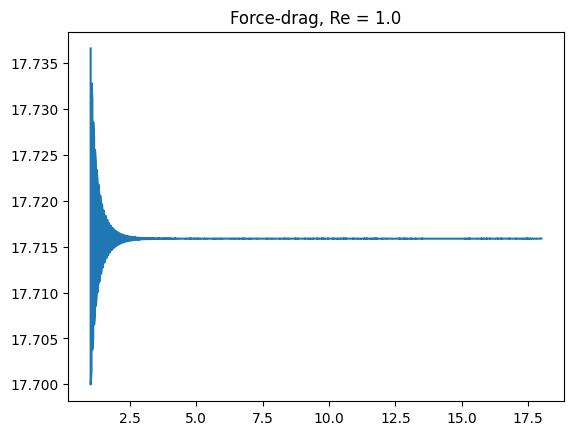

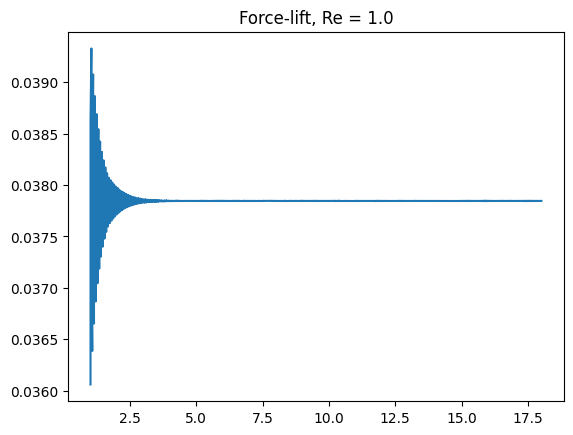

Time t = 21.027239472961604


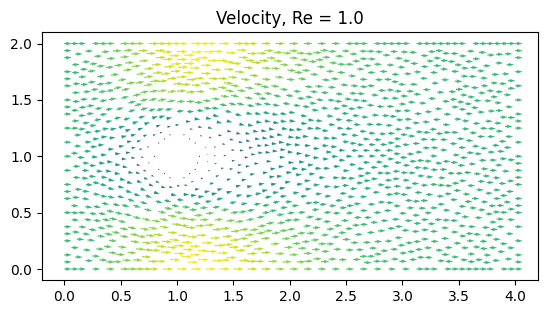

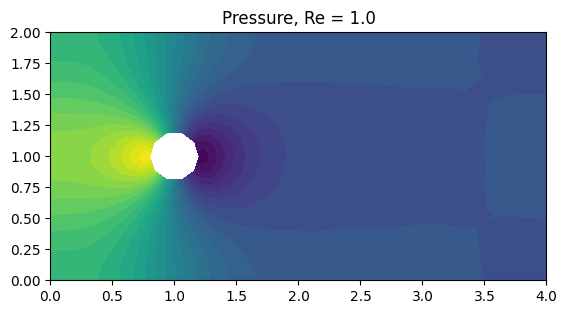

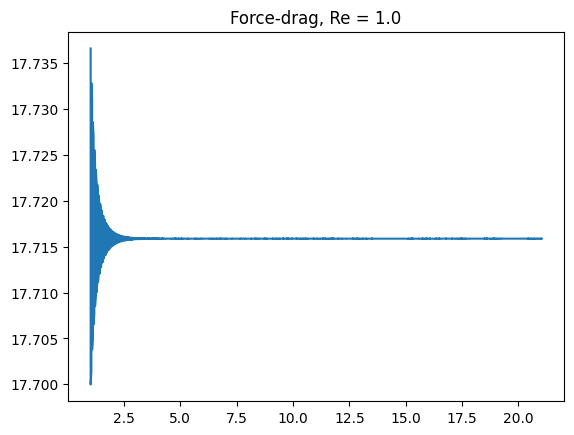

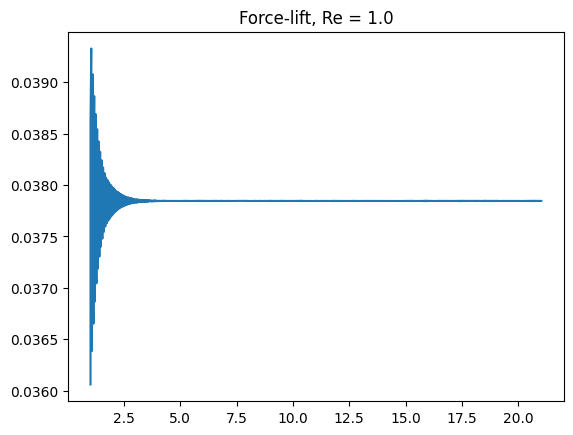

Time t = 24.017050085523426


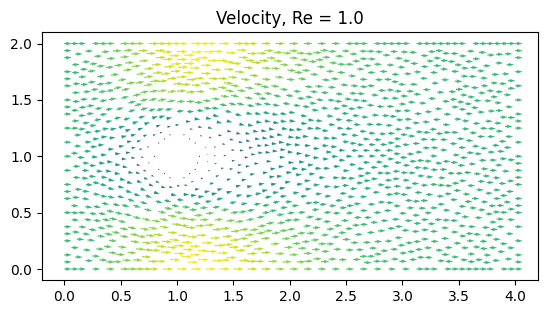

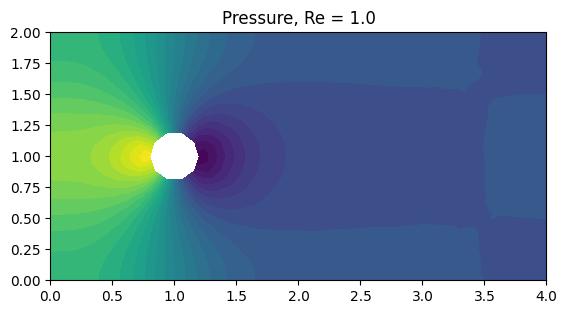

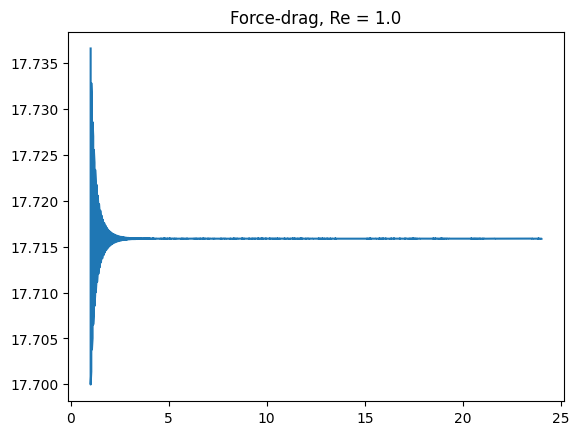

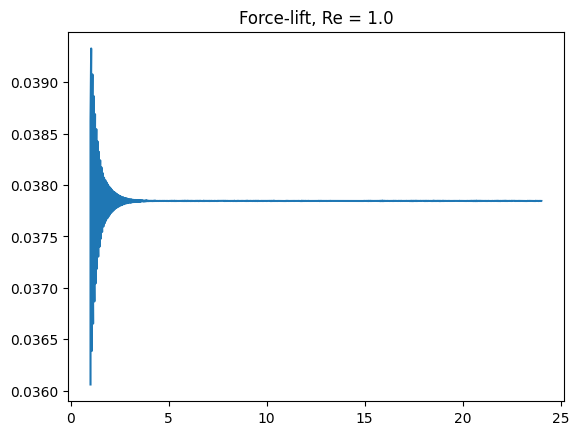

Time t = 27.006860698085248


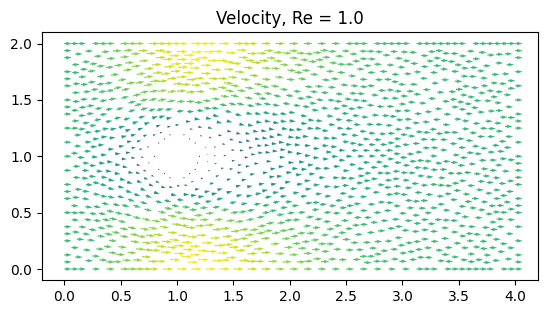

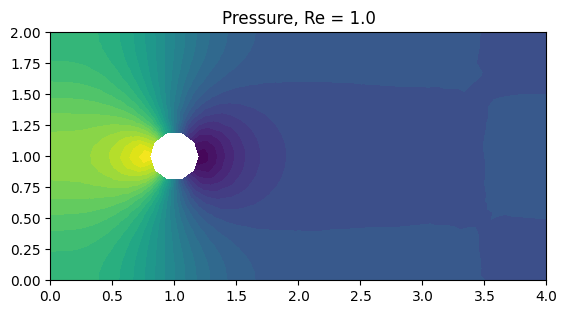

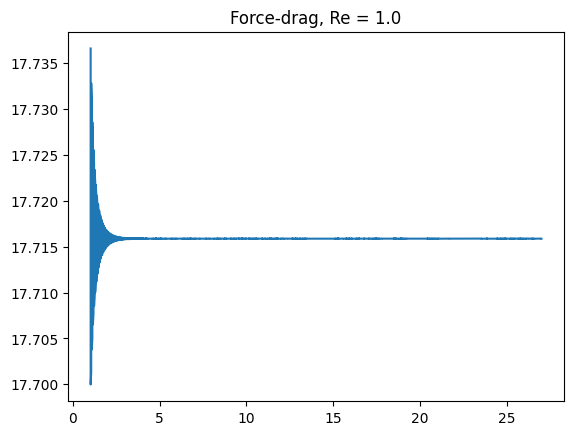

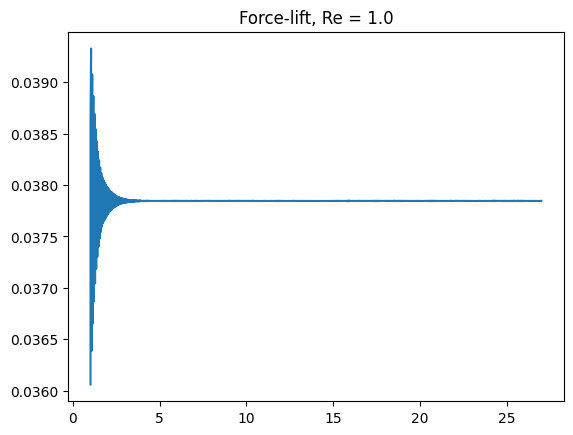

In [ ]:
time_step("32", 0.4)

Plot the results for a resolution of $\frac{1}{16}$ and $\nu = 0.004$.

rm: cannot remove 'results-NS/*': No such file or directory


DEBUG:UFL:Blocks of each mode: 
  24	partial
DEBUG:UFL:Blocks of each mode: 
  6	full
DEBUG:UFL:Blocks of each mode: 
  4	partial
DEBUG:UFL:Blocks of each mode: 
  2	full
DEBUG:UFL:Blocks of each mode: 
  1	full


Time t = 0.06628038350651762


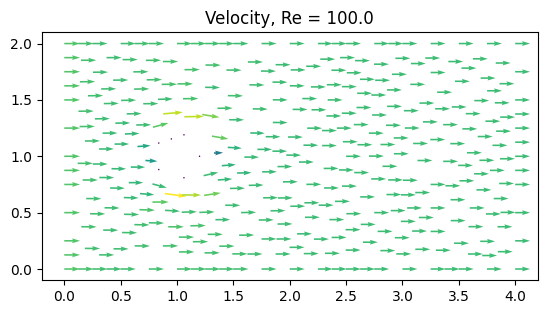

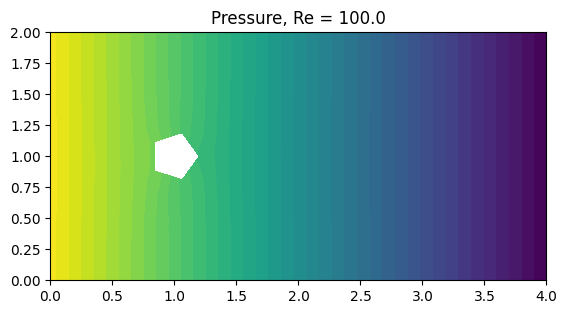

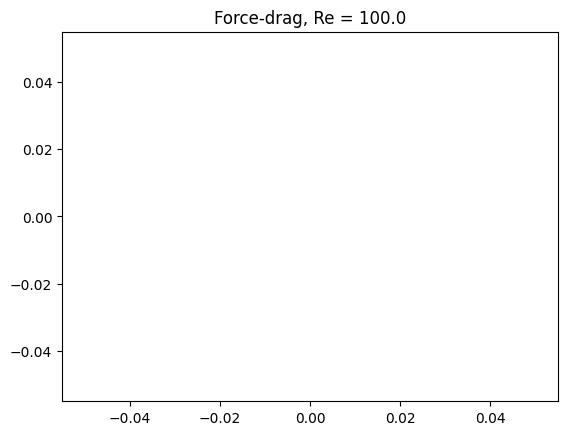

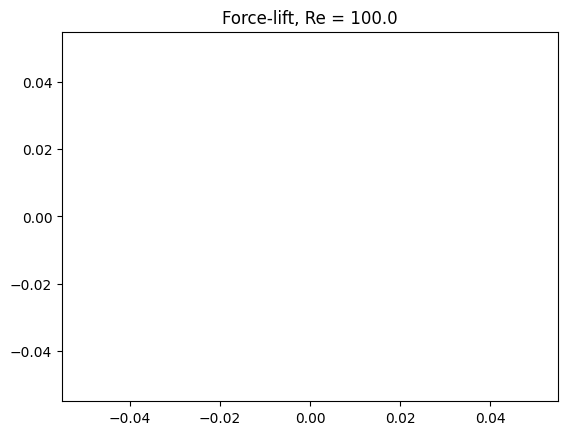

Time t = 3.0488976412998086


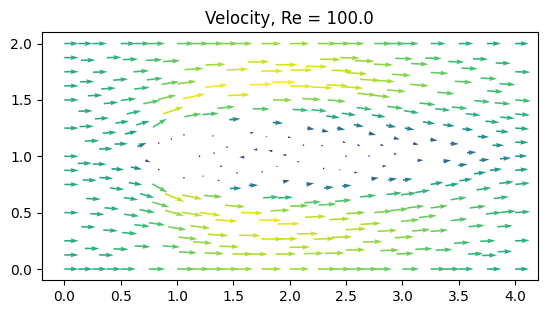

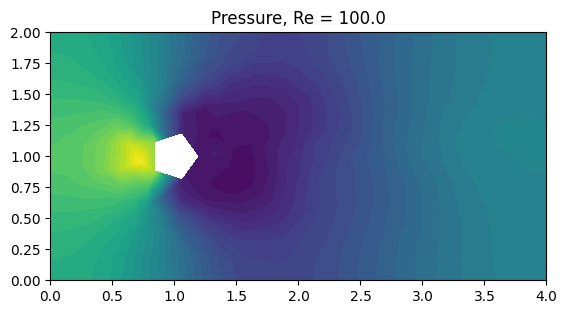

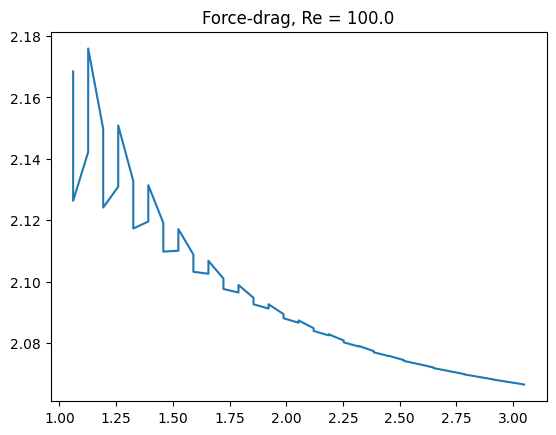

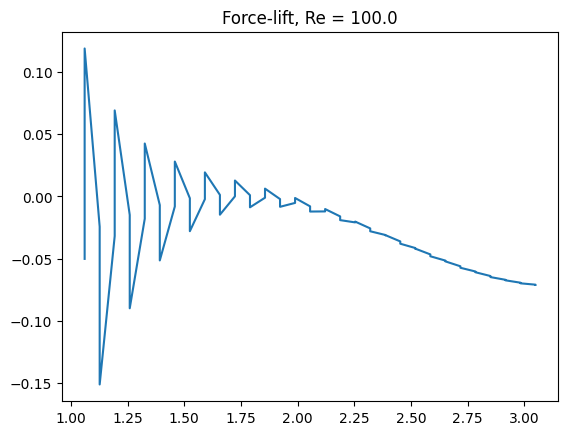

Time t = 6.031514899093112


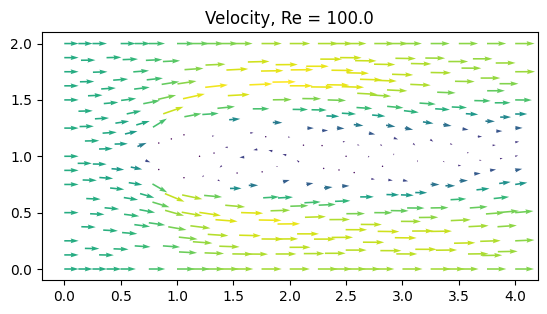

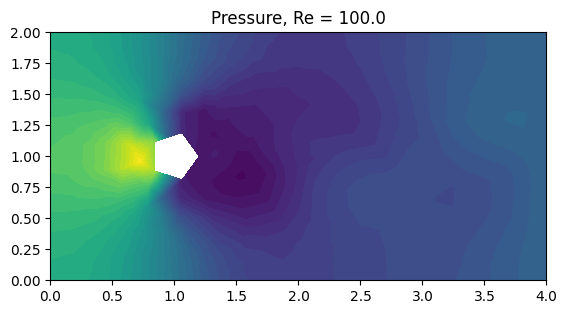

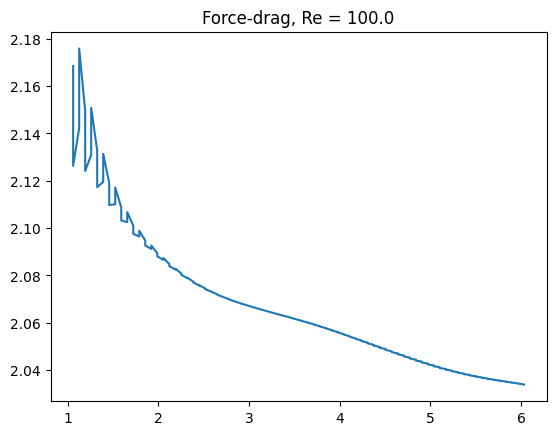

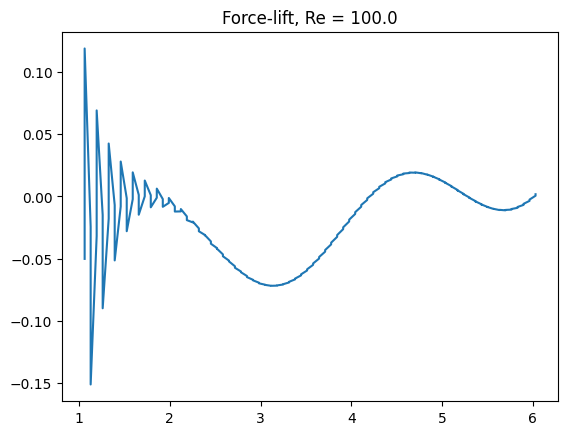

Time t = 9.01413215688642


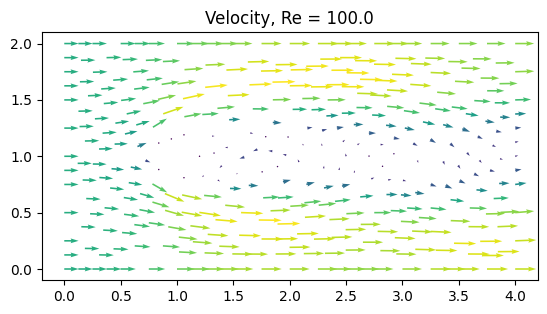

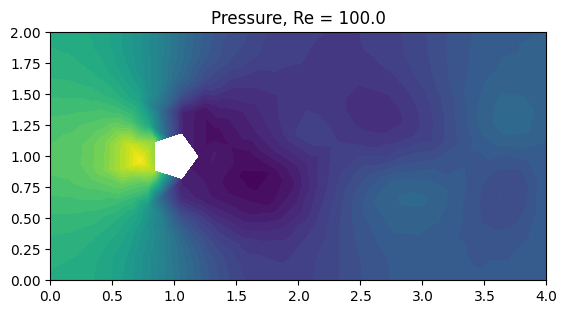

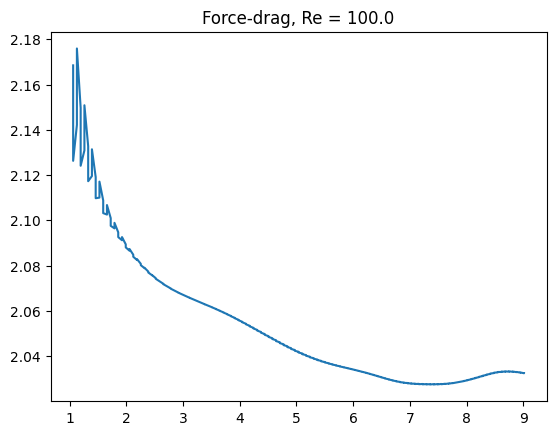

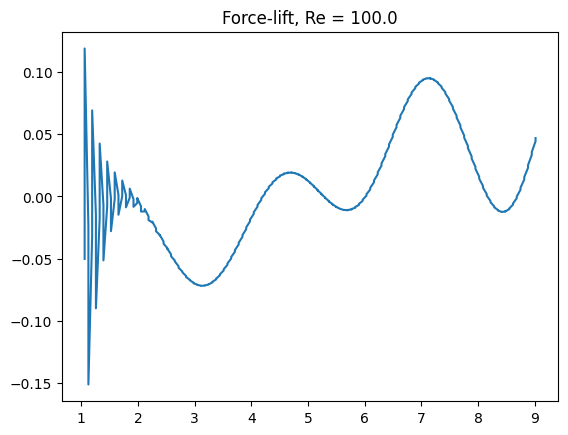

Time t = 12.063029798186248


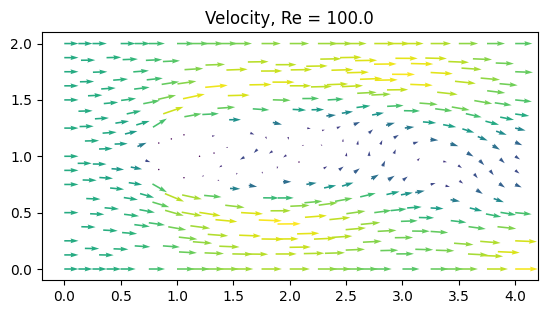

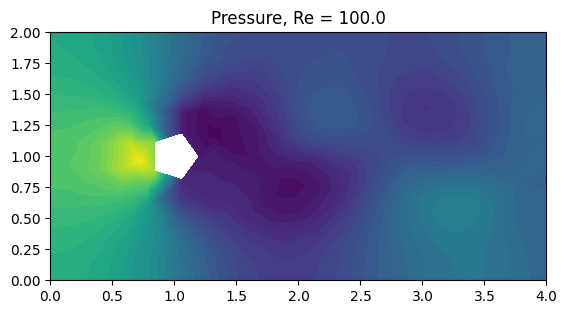

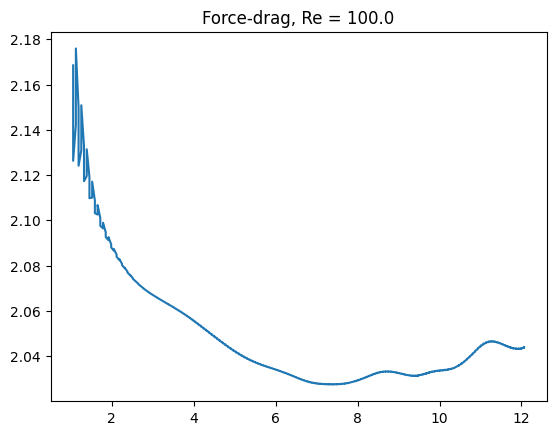

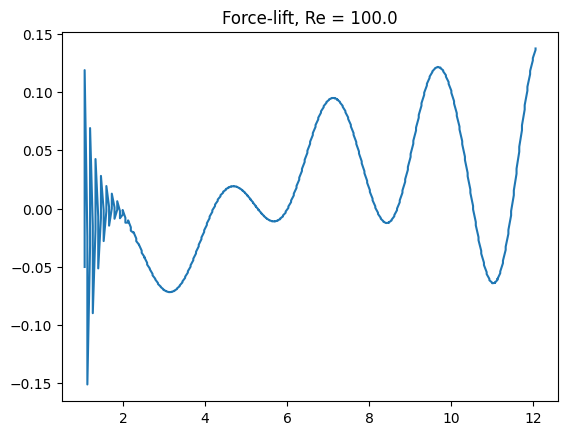

Time t = 15.045647055979558


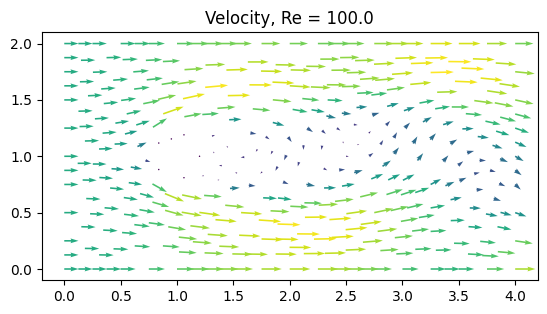

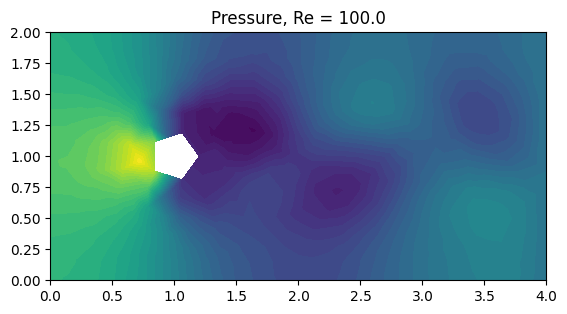

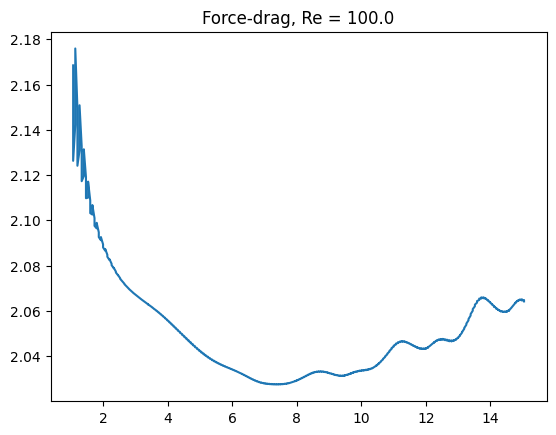

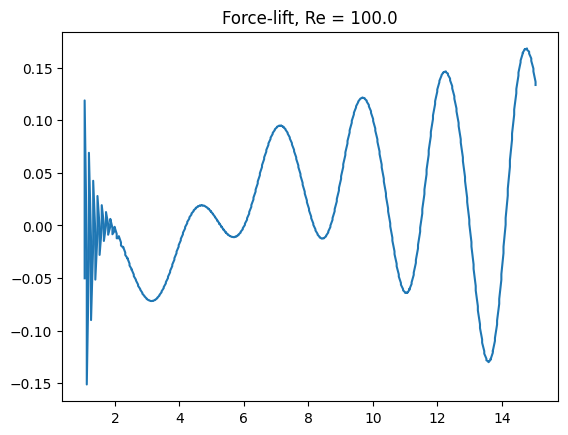

Time t = 18.028264313772812


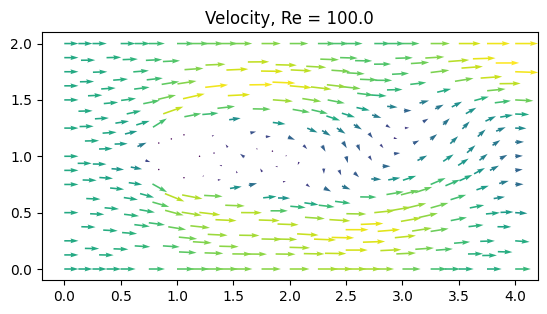

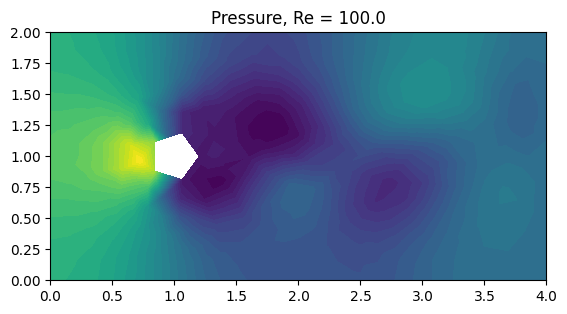

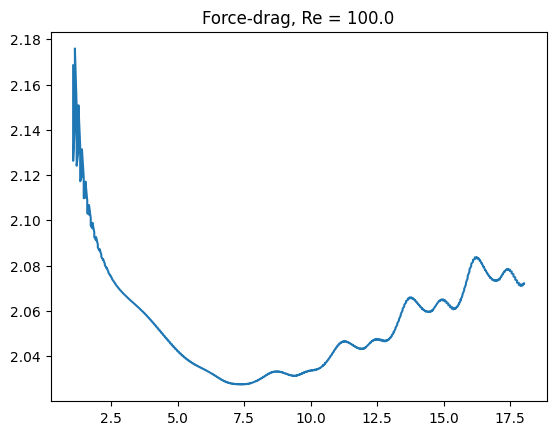

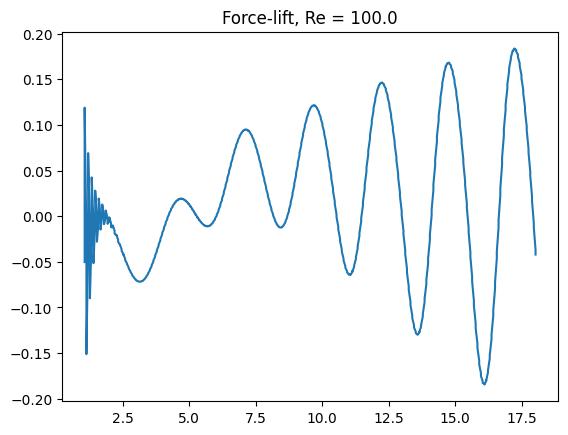

Time t = 21.010881571566042


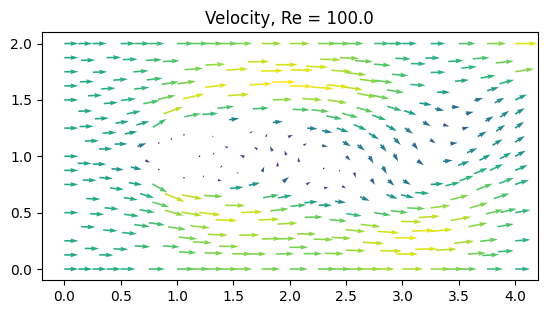

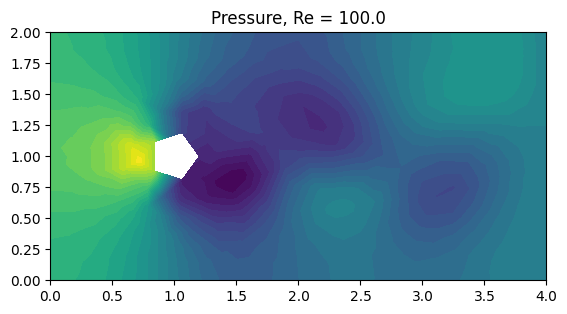

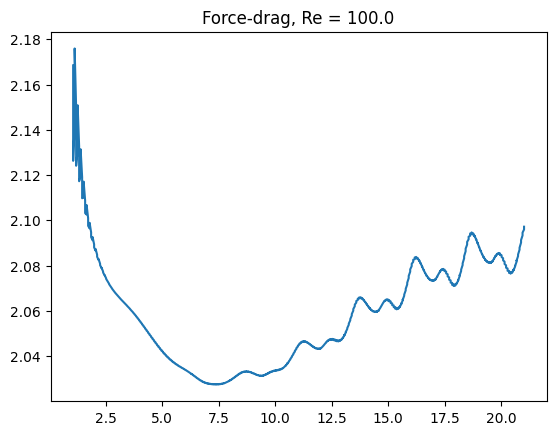

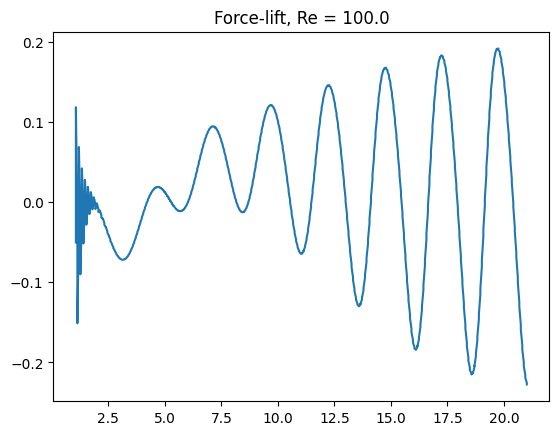

Time t = 24.059779212865788


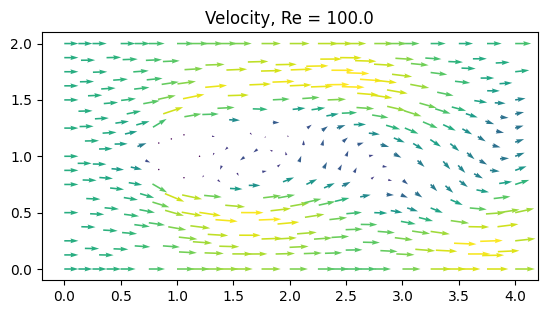

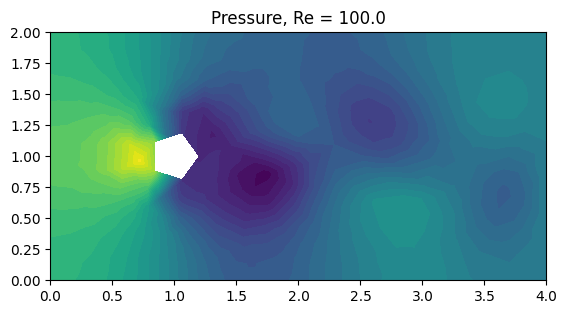

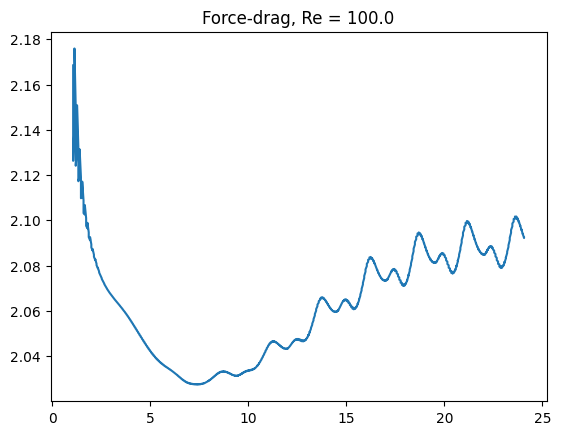

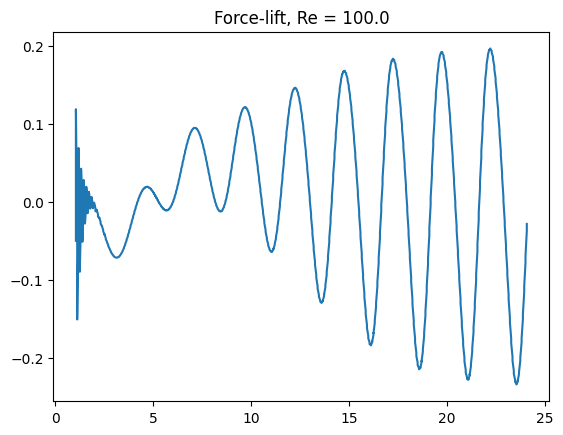

Time t = 27.042396470659018


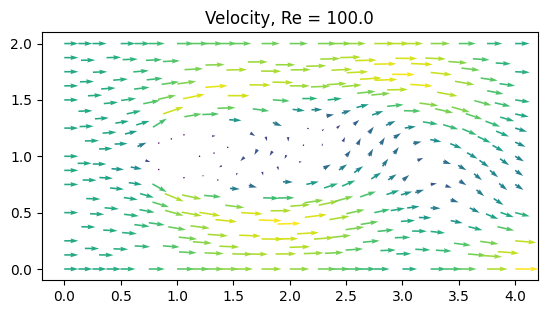

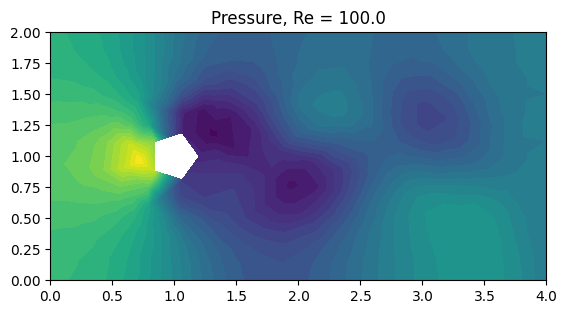

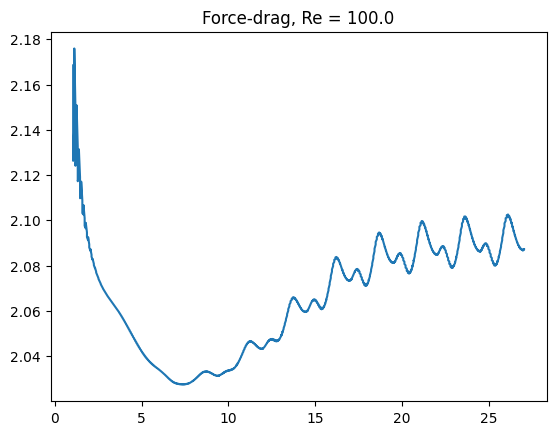

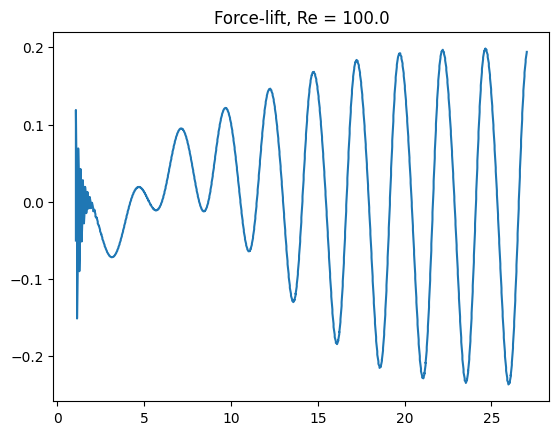

In [ ]:
time_step("16", 4.0e-3)

Plot the results for a resolution of $\frac{1}{8}$ and $\nu = 0.004$.

rm: cannot remove 'results-NS/*': No such file or directory


DEBUG:UFL:Blocks of each mode: 
  24	partial
DEBUG:UFL:Blocks of each mode: 
  6	full
DEBUG:UFL:Blocks of each mode: 
  4	partial
DEBUG:UFL:Blocks of each mode: 
  2	full
DEBUG:UFL:Blocks of each mode: 
  1	full


Time t = 0.13091486480653436


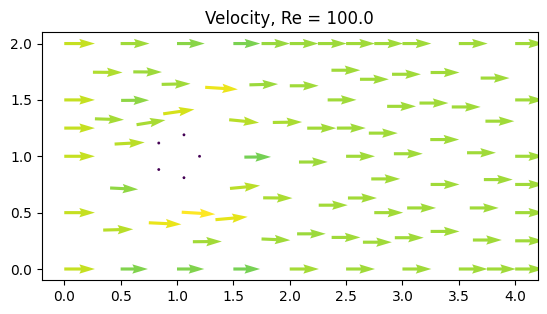

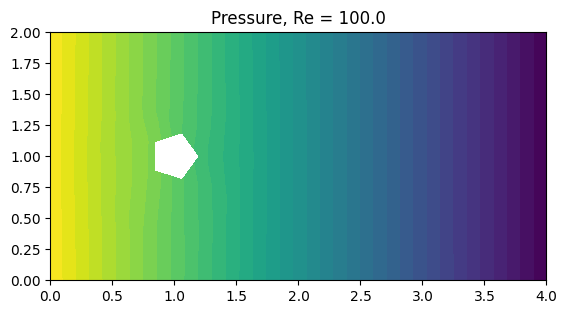

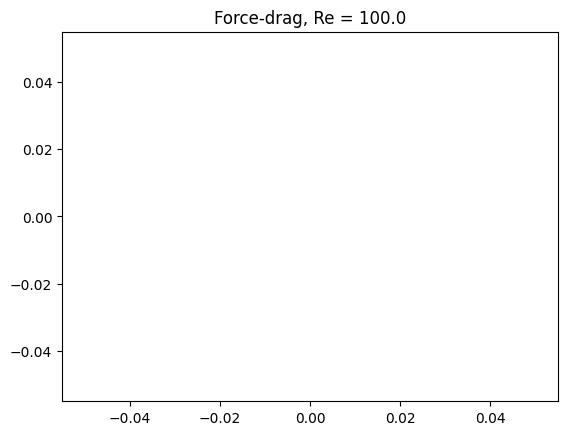

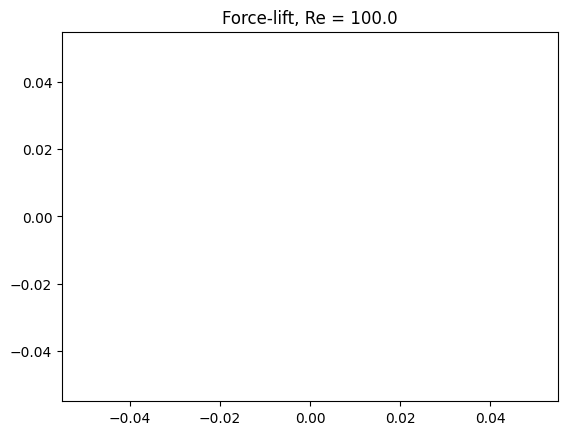

Time t = 3.011041890550292


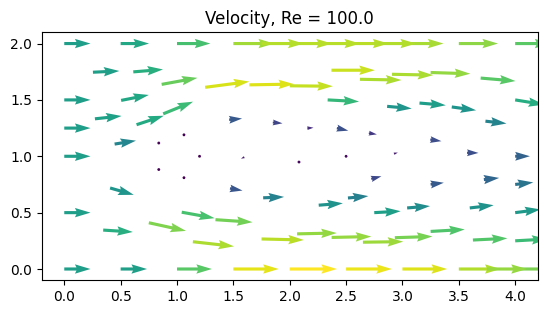

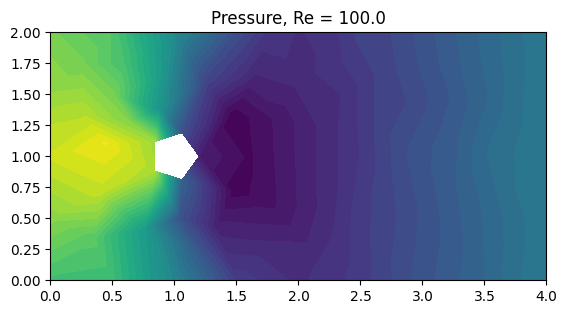

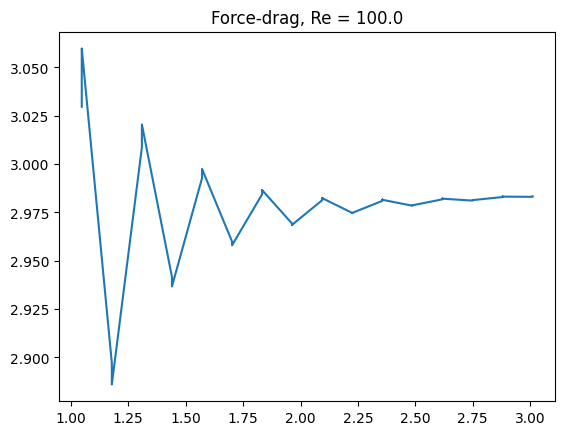

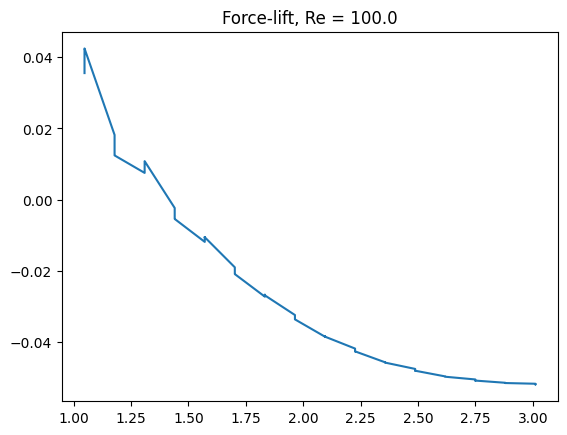

Time t = 6.022083781100587


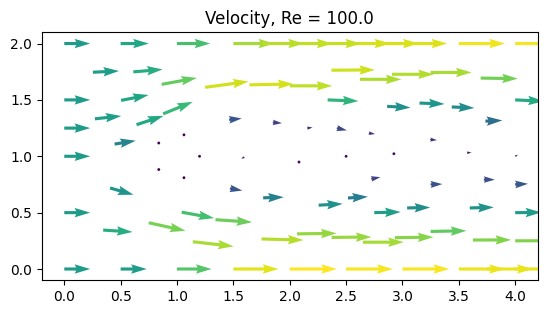

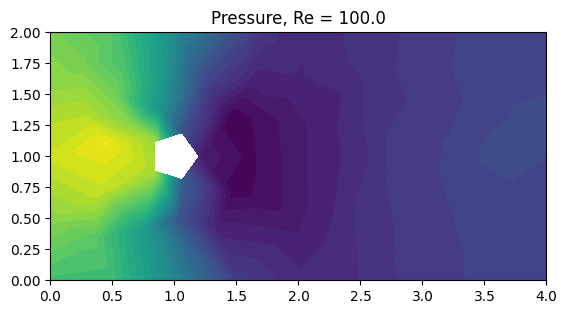

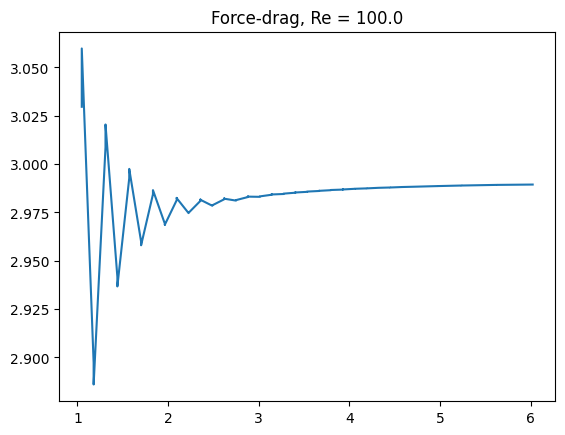

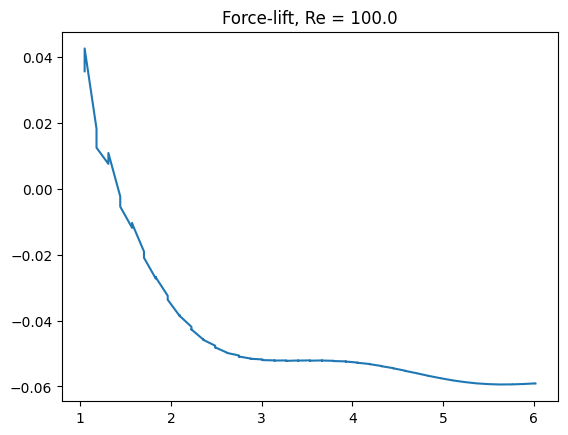

Time t = 9.033125671650883


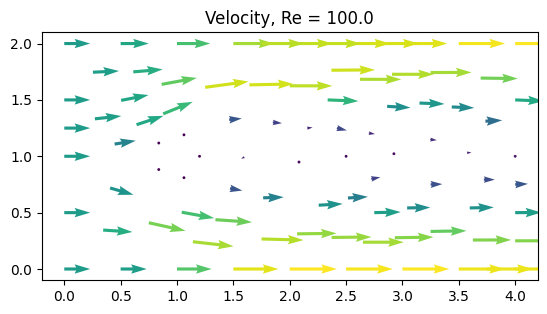

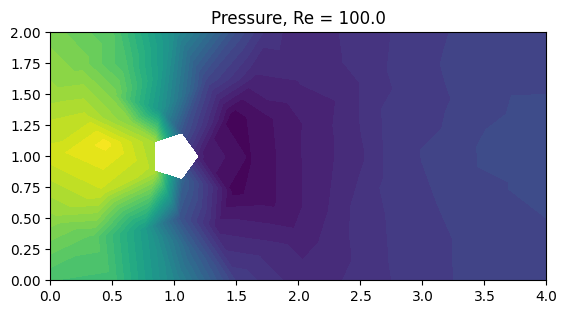

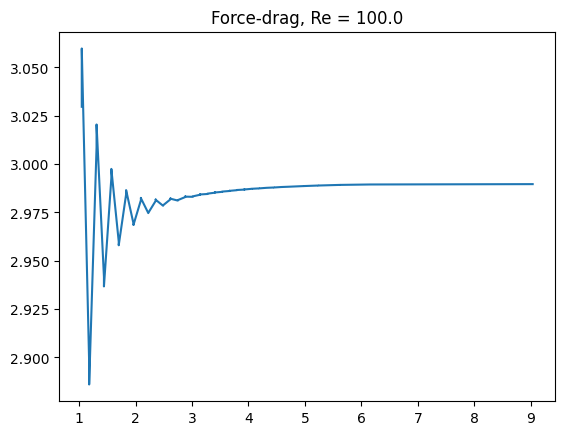

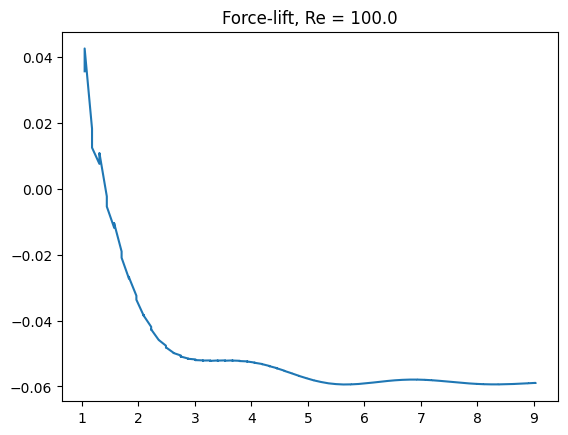

Time t = 12.044167562201178


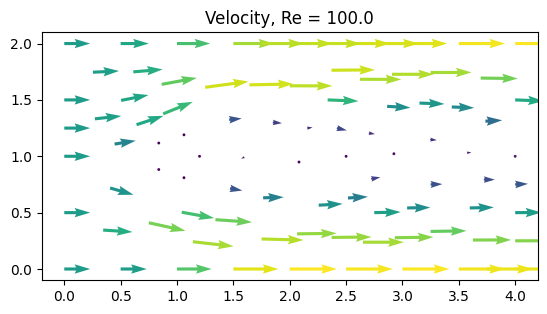

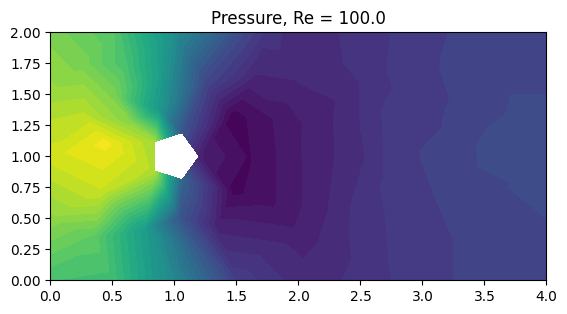

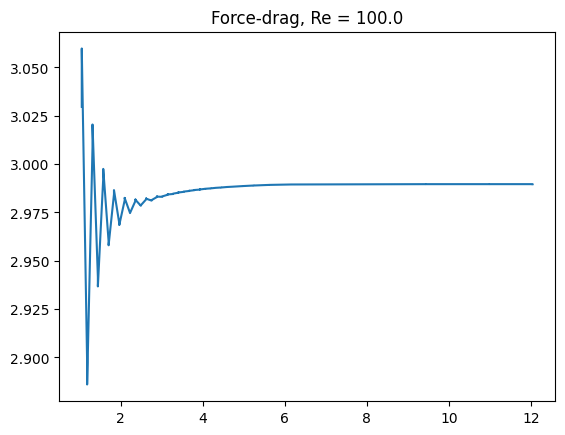

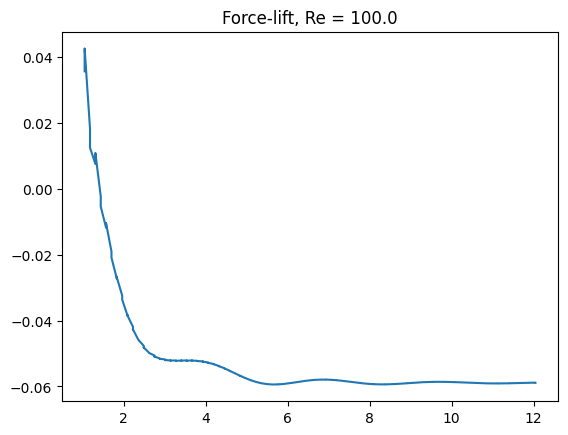

Time t = 15.055209452751473


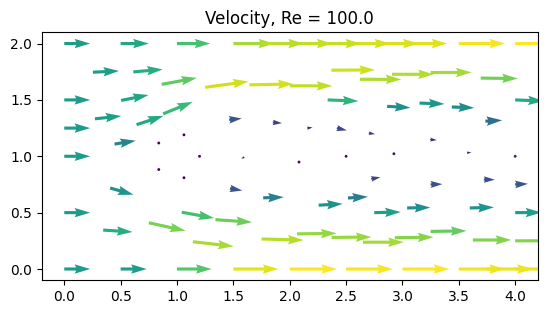

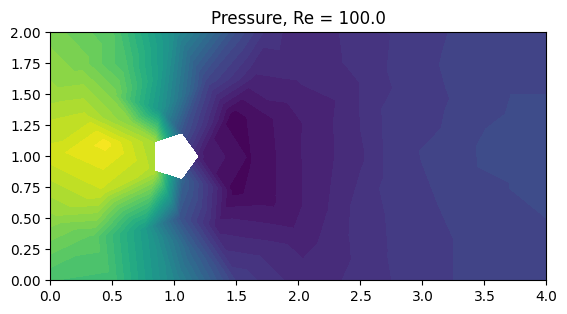

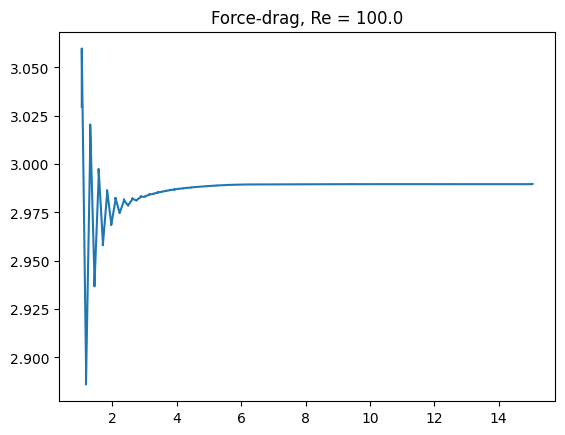

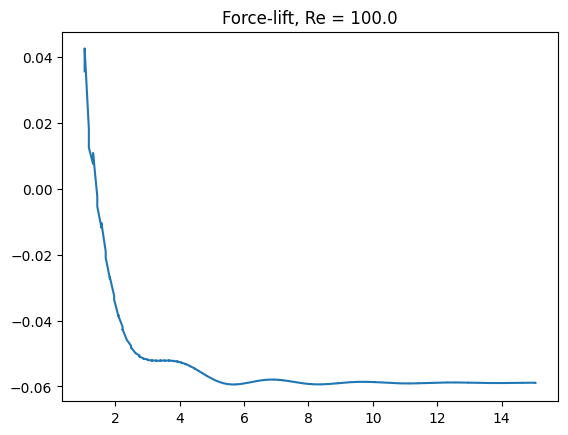

Time t = 18.06625134330177


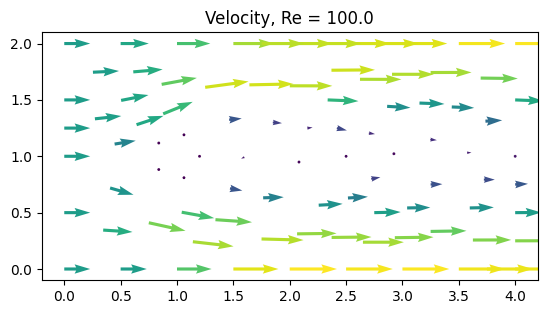

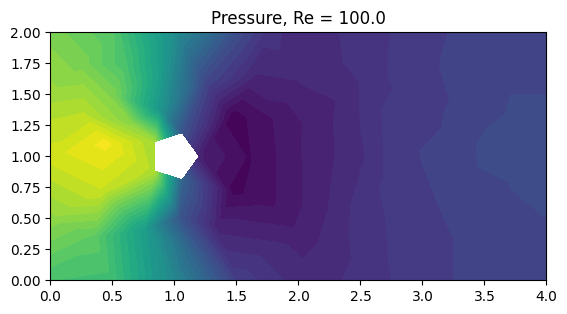

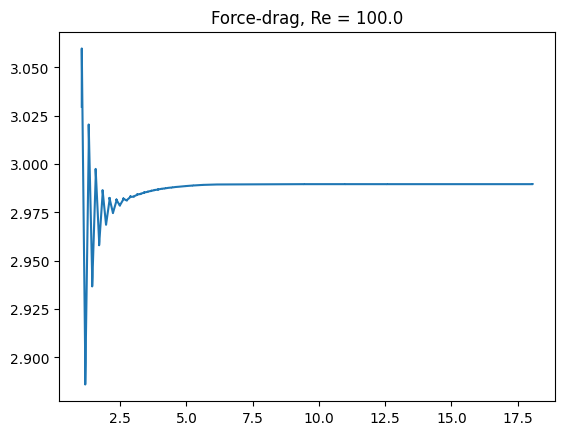

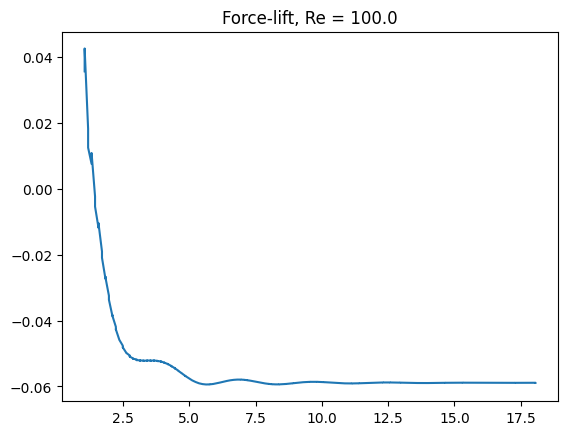

Time t = 21.077293233852064


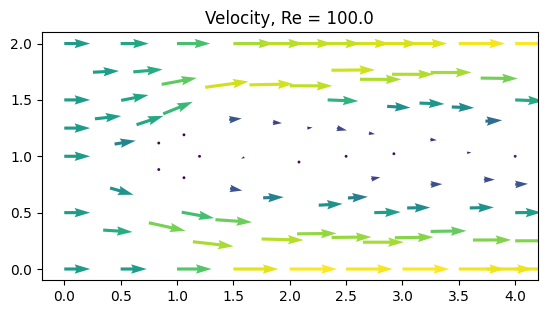

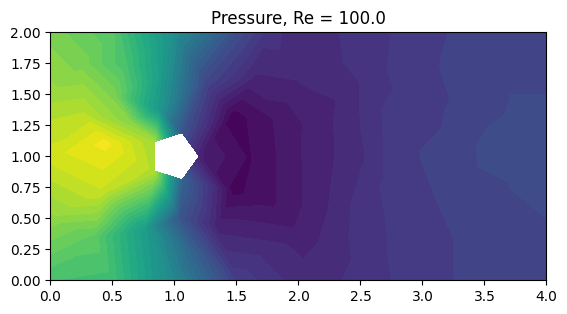

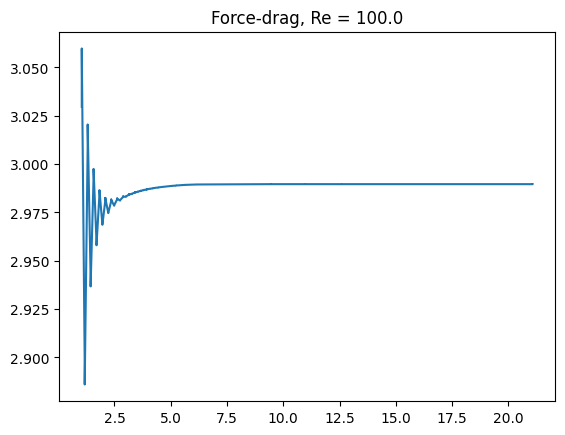

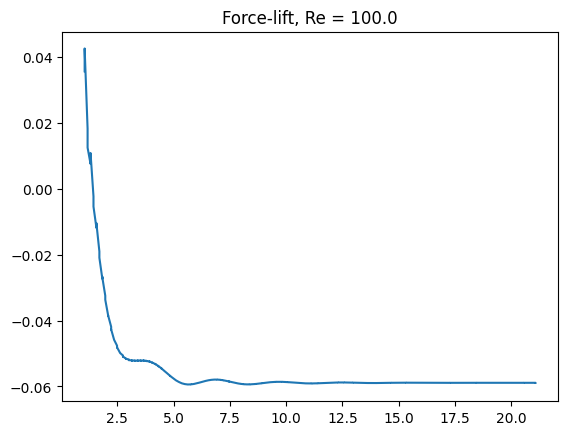

Time t = 24.08833512440236


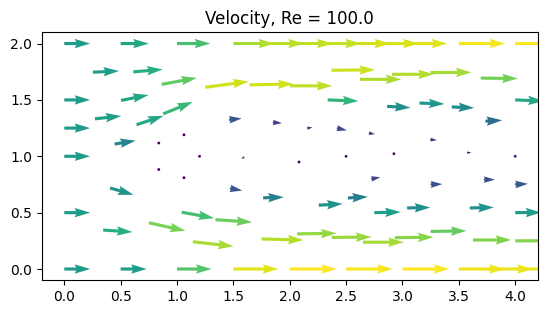

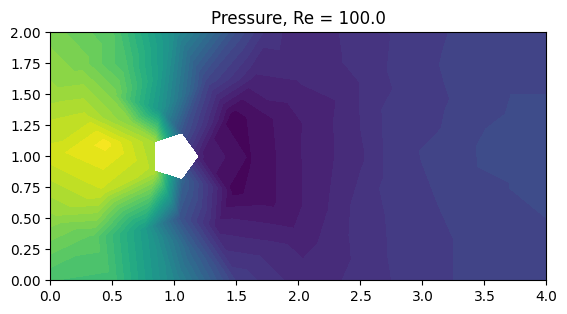

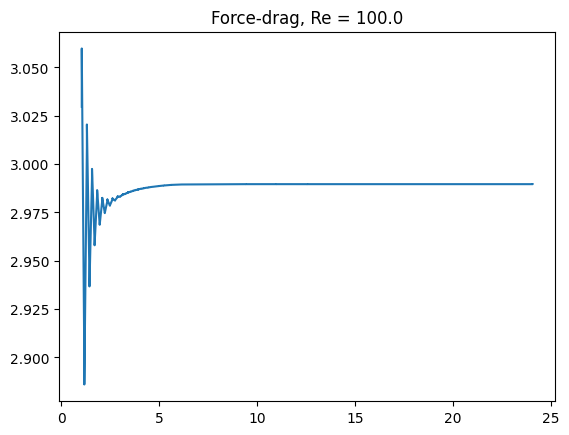

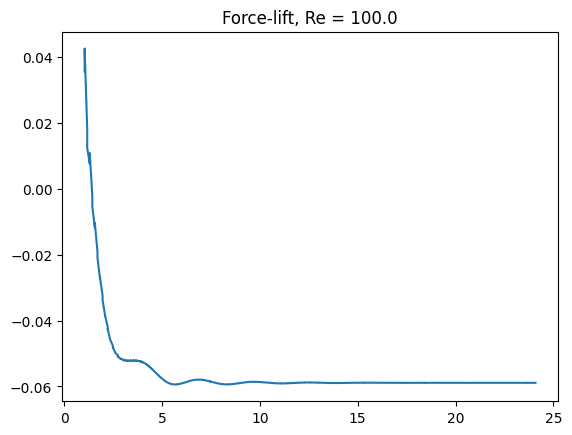

Time t = 27.099377014952655


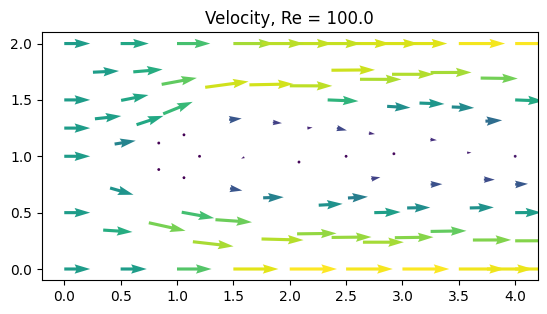

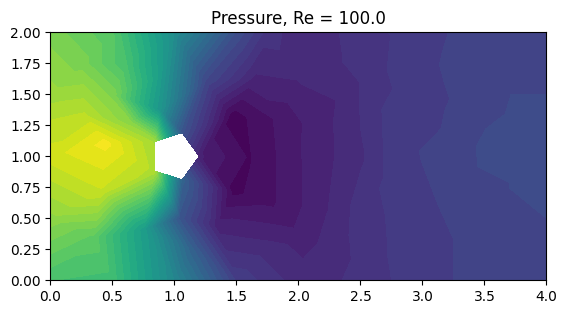

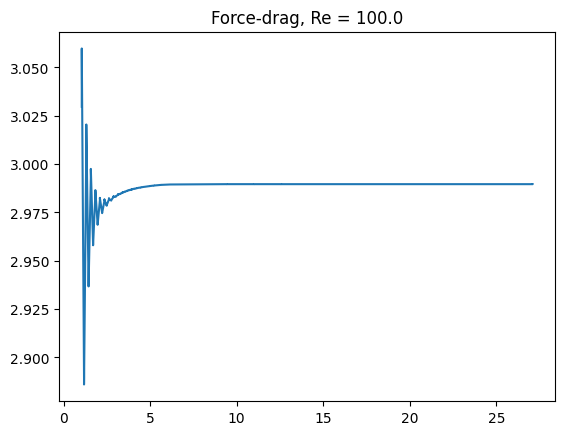

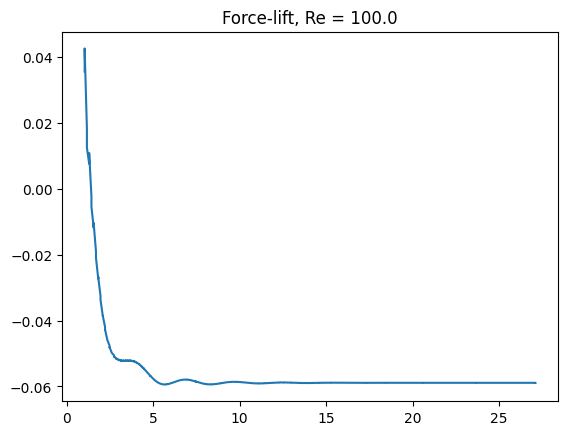

In [ ]:
time_step("8", 4.0e-3)

Using the plots from the simulations, the values for the lift coefficients, drag coefficients and Strouhal numbers could be calculated. We use the relations presented in the introduction:

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}.
$

Additionally, the Strouhal number is calculated using the formula

$St = \frac{fD}{U}$

where $f$ is the vortex shedding frequency (estimated as the number of vortices generated per second). For simulations with resolution $\frac{1}{32}$ and $RE = 100,1000$, 5 vortices were counted during a span of $10$ seconds, and for $\frac{1}{16}$ and $RE = 100$, 4 vortices were counted during $10$ seconds. The results are presented in the table below:

$
\begin{array}{ccccc}
Re&Resoulution&c_L&c_D&St\\
1&\frac{1}{32}&0.19&89&0\\
10&\frac{1}{32}&2.7&18&0\\
100&\frac{1}{32}&8.8&2.0&0.2\\
1000&\frac{1}{32}&8.0&3.5&0.2\\
100&\frac{1}{16}&1.1&10&0.16\\
100&\frac{1}{8}&0.30&15&0\\
\end{array}
$

Additionally, a movie showing the solution for the Reynolds number $Re=100$ and $h = \frac{1}{32}$ were exported using the Paraview open source software. The results are displayed in the attached mp4-file.

Time t = 0.03285506167650246


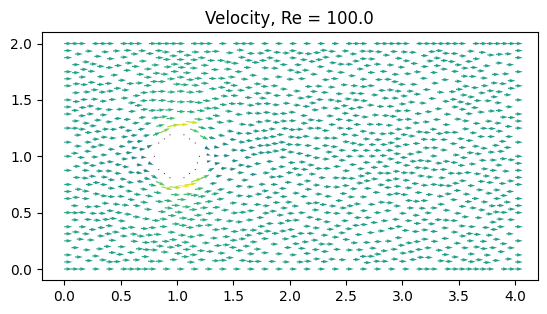

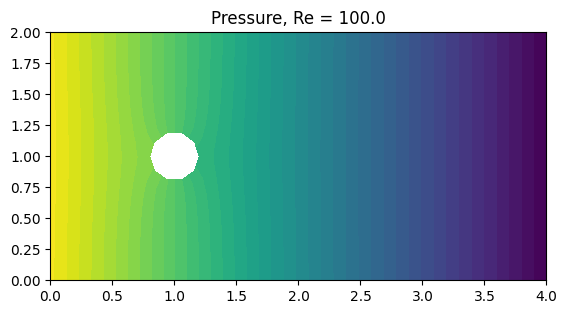

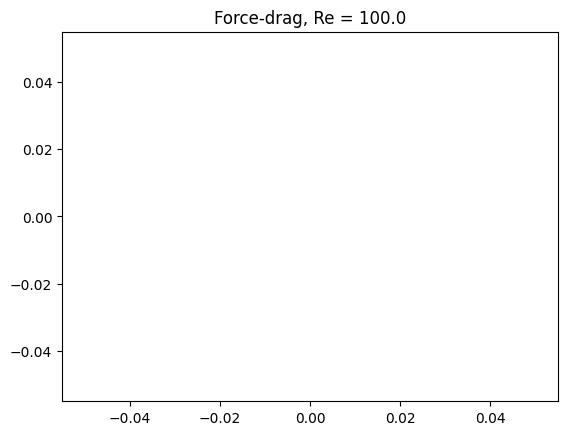

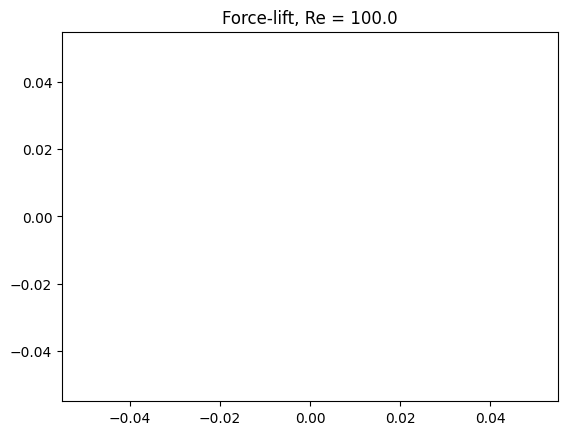

Time t = 3.022665674238231


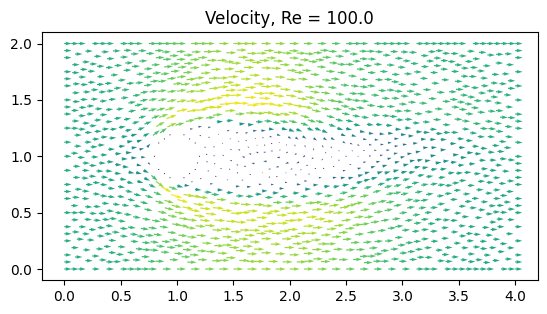

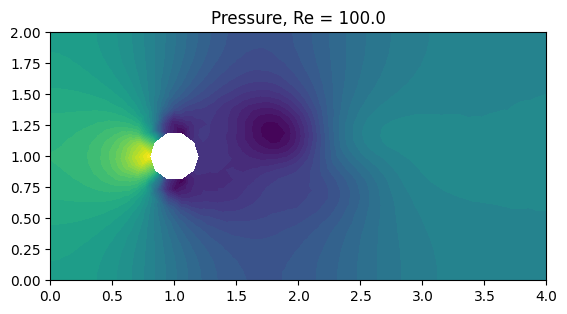

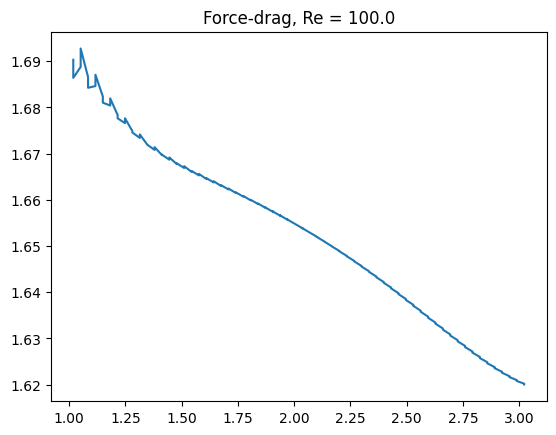

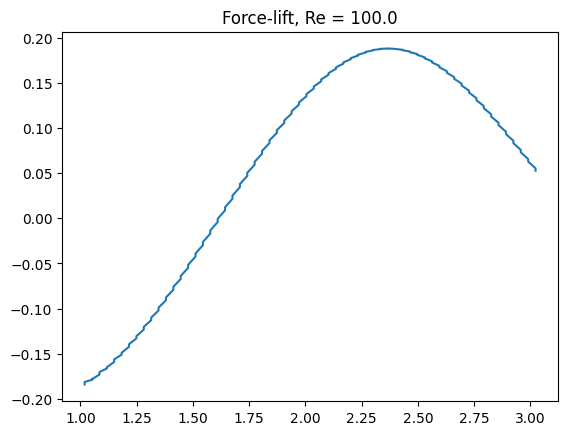

Time t = 6.012476286799972


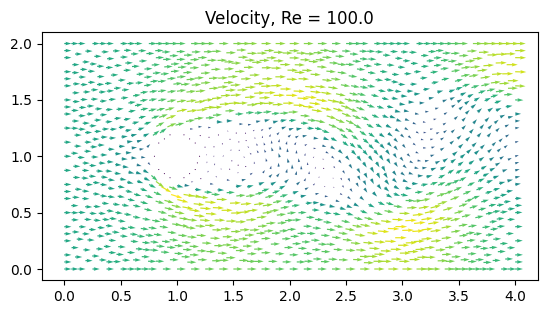

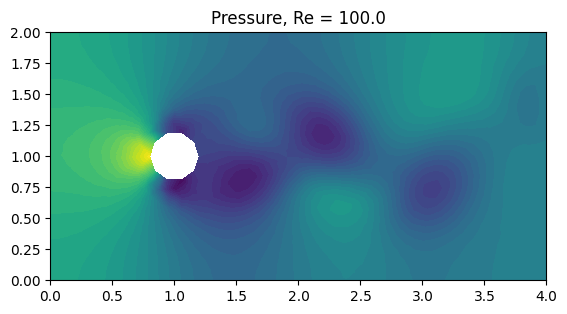

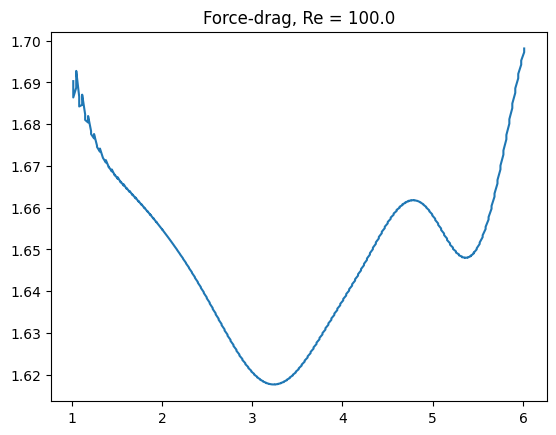

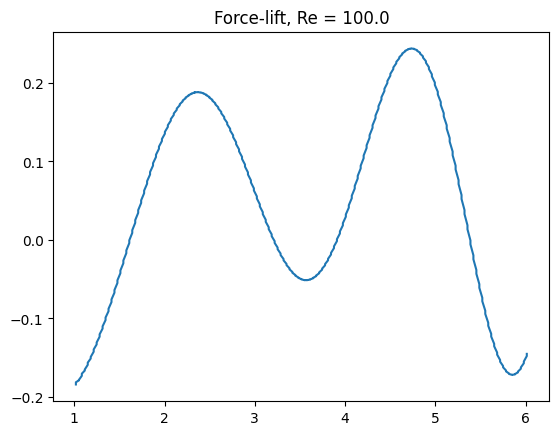

Time t = 9.002286899361685


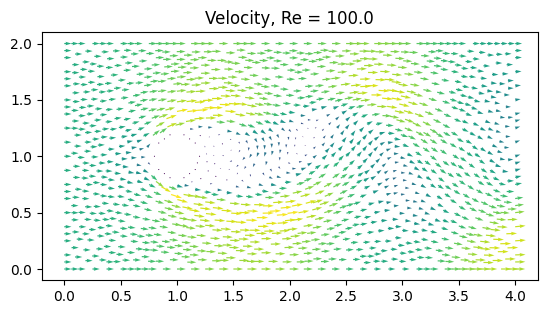

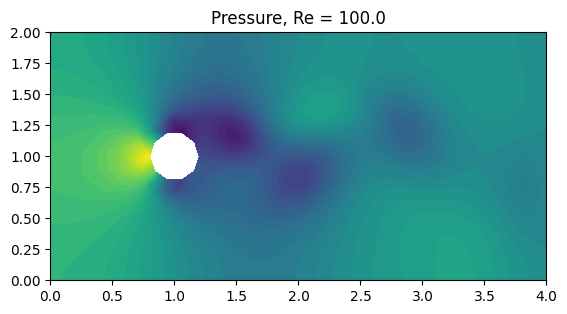

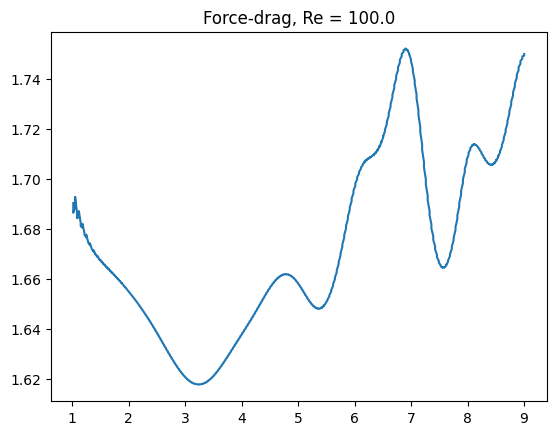

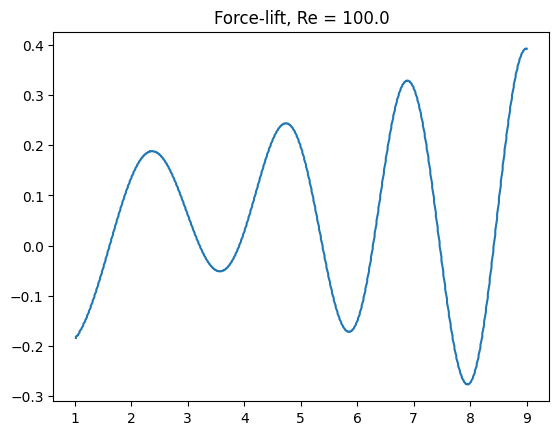

Time t = 12.024952573599847


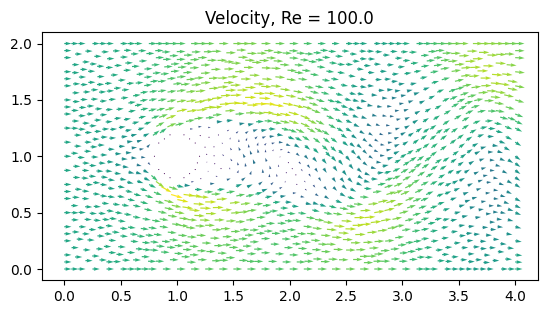

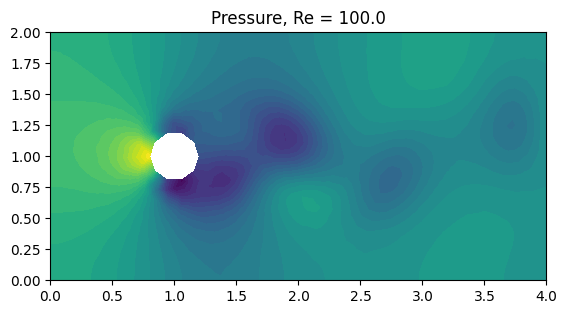

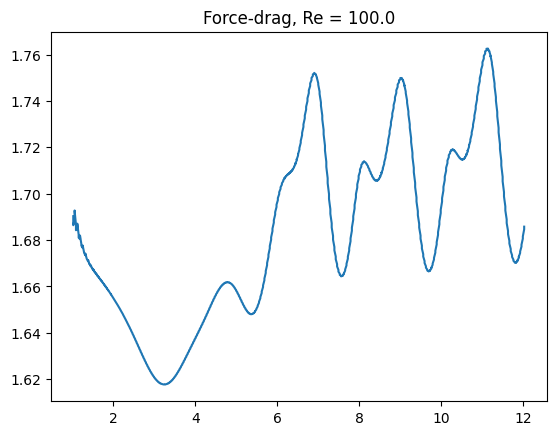

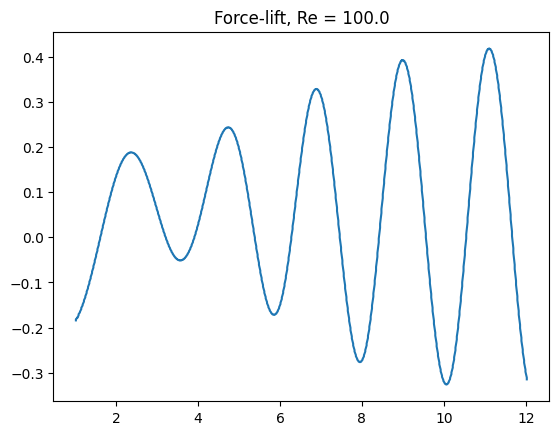

Time t = 15.014763186161508


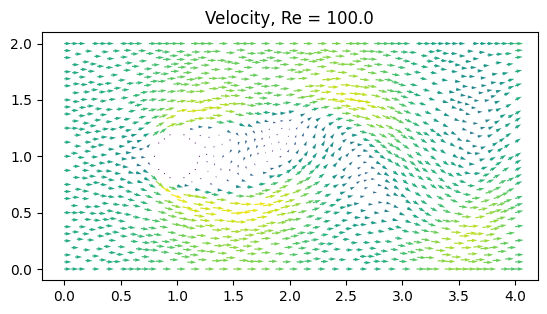

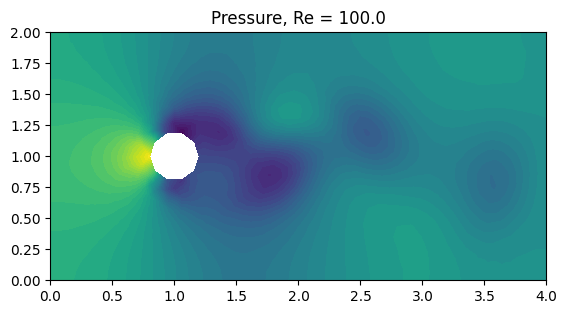

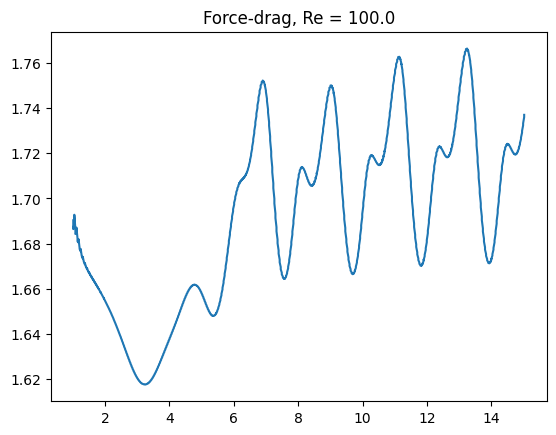

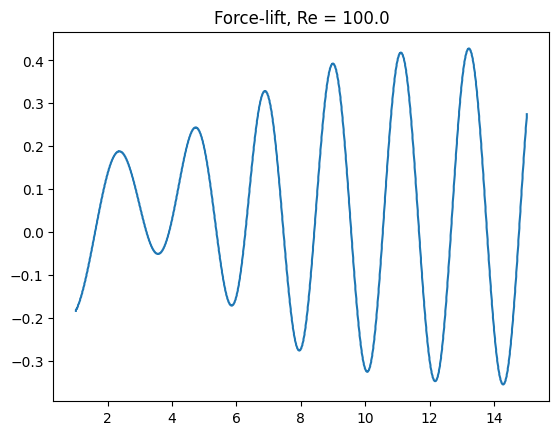

Time t = 18.00457379872328


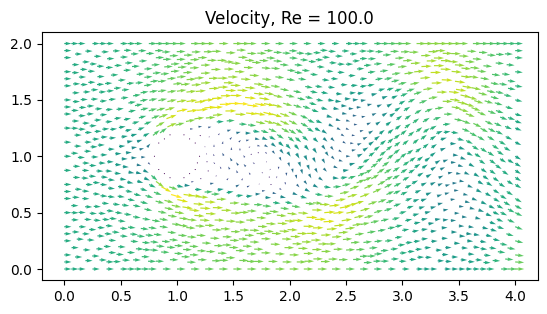

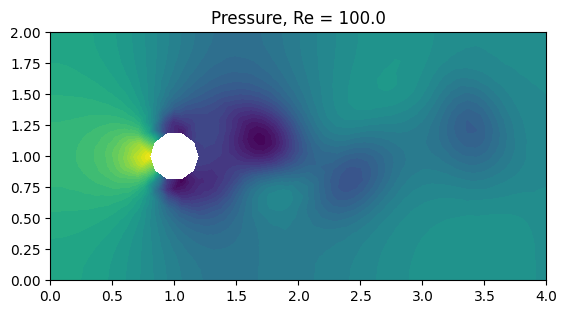

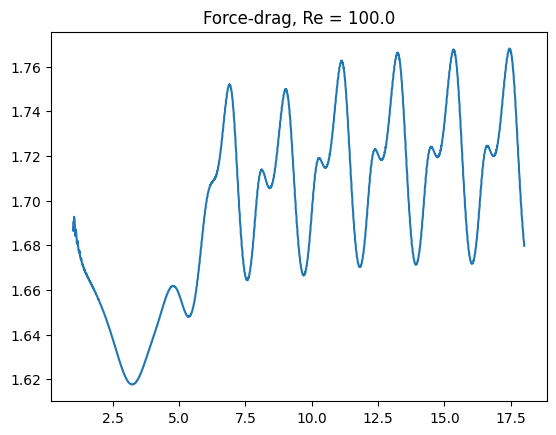

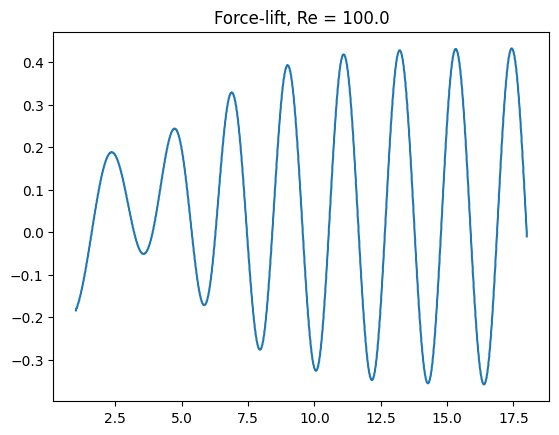

Time t = 21.027239472961604


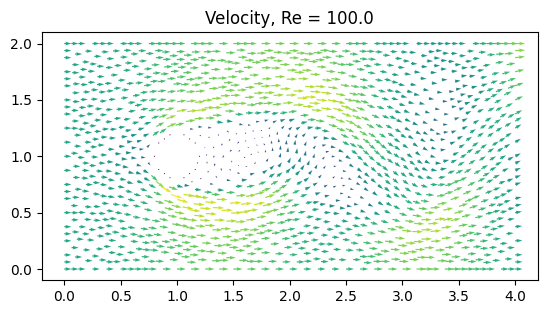

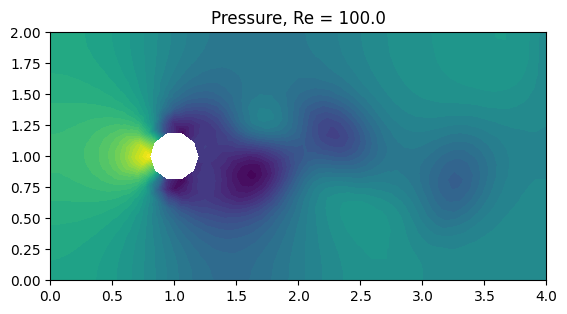

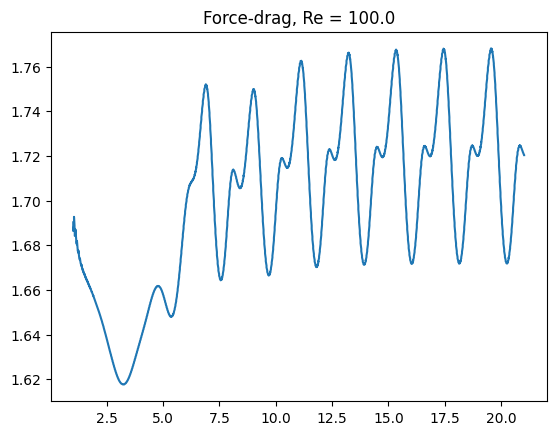

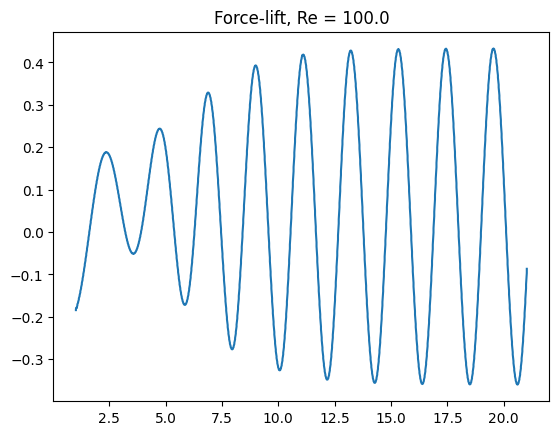

Time t = 24.017050085523426


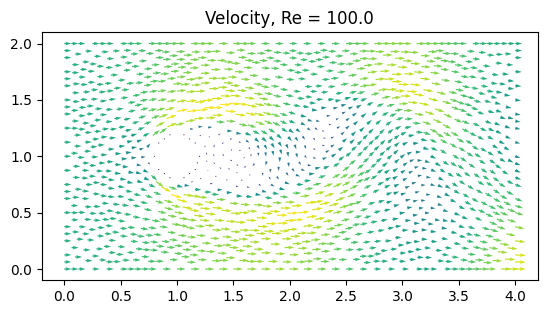

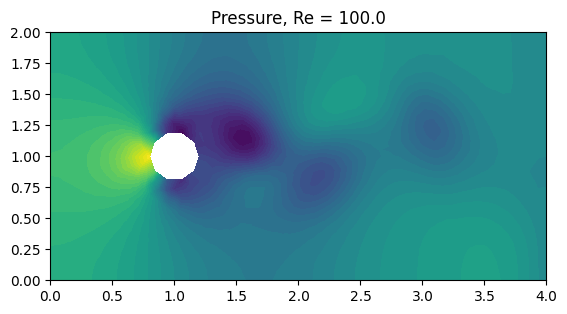

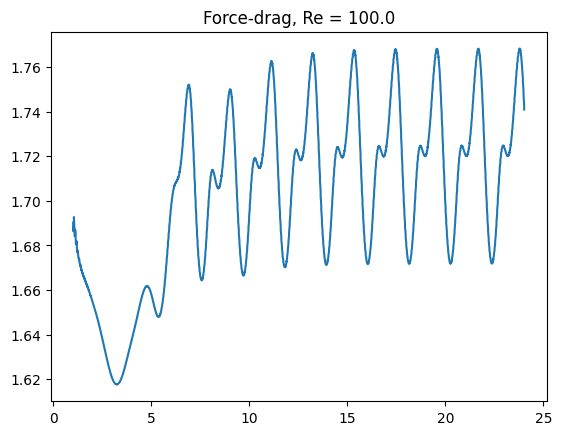

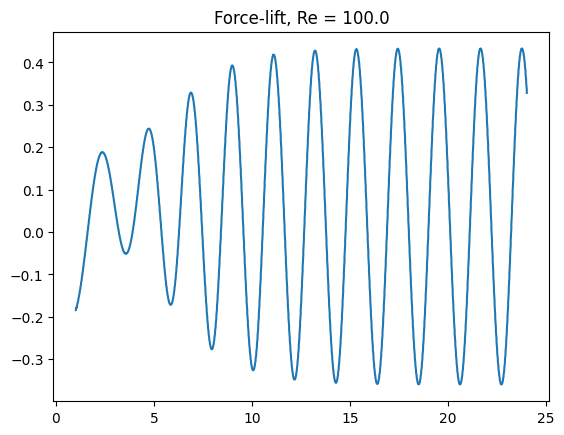

Time t = 27.006860698085248


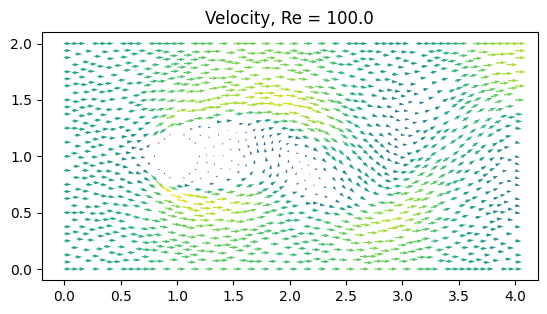

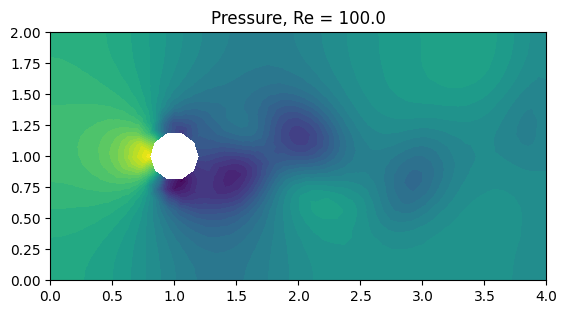

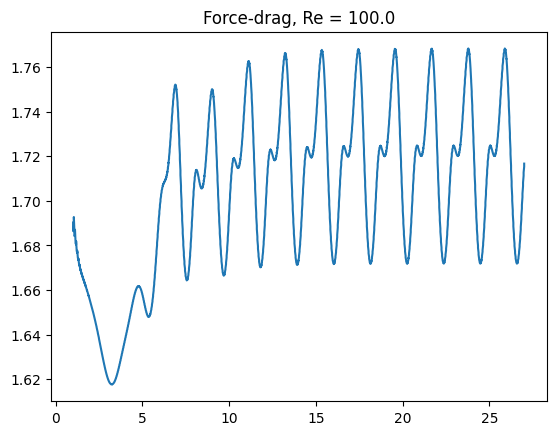

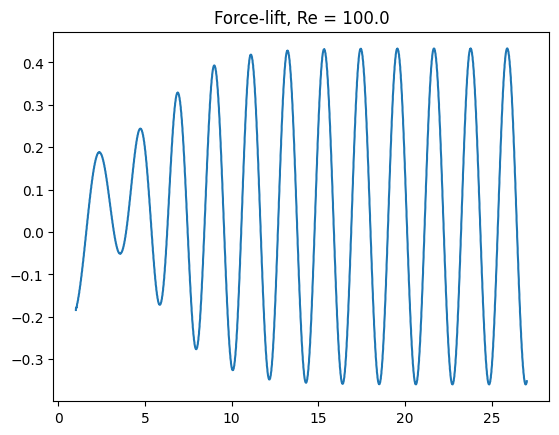

results-NS/
results-NS/p000003.vtu
results-NS/p.pvd
results-NS/u000000.vtu
results-NS/u000003.vtu
results-NS/p000007.vtu
results-NS/u000007.vtu
results-NS/p000009.vtu
results-NS/u000008.vtu
results-NS/p000008.vtu
results-NS/u000002.vtu
results-NS/u000004.vtu
results-NS/p000004.vtu
results-NS/u000006.vtu
results-NS/u000005.vtu
results-NS/u.pvd
results-NS/p000000.vtu
results-NS/u000001.vtu
results-NS/p000002.vtu
results-NS/p000001.vtu
results-NS/u000009.vtu
results-NS/p000006.vtu
results-NS/p000005.vtu


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [28]:
time_step("32", 4.0e-3, movie = True)

# **Discussion**

Through our results, we have observed that instability, I.E. the appearance of vortices, occured for the higher values if the Reynolds number, $RE = 100,1000$, and seemed to occur more easily for higher values of the resolution. This seems to be because the subtle effects cannot be captured by the coarse grid, and we instead get a simple laminar flow. We also notice this through the lift coefficient decreasing and the drag coefficient increasing as the grid resolution gets coarser.

The experiment also verifies that the von Karman vortex street has a Strouhal number that is approximately equal to $0.2$. A higher precision estimate of this value could of course be calculated by running the simulation for longer and counting more vortices over a longer time-span.